# Important! 
When initially opening the notebook there should be a text to the right of the "Help" menu saying "Changes will not be saved". 
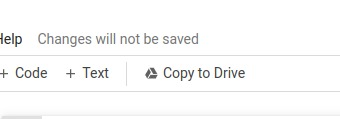

To ensure you can make changes to the notebook save a copy of it to your own drive and work on that one. You can do that by going to "File" -> "Save a copy in Drive".

**Failing to do so will result in code loss!**

 **Note** Make sure you are the only one that has access to it!


In [ ]:
#@markdown #Image Processing - 67829. { display-mode: "form" }
#@markdown ##Exercise 5:  Deep Style Image Prior
#@markdown ##Due date: 13.01.2022 at 23:59
#@title{ display-mode: "form" }

#@markdown
#@markdown This exercise is a bit different than the rest of the exercises in the course.
#@markdown The submissions will be a PDF file with your answers and results to the exercise 
#@markdown as well as some files so that we can verify the authenticity of your results.
#@markdown This notebook provides the basic code, but you do not need to adhere to some specific API 
#@markdown and we will not be running unit tests on your code. 
#@markdown We will however, be going over your code and running it manually. 
#@markdown Moreover, we will be running tests to ensure the authenticity of your solution and detect plagiarism
#@markdown
#@markdown
#@markdown Before you start working on the exercise it is recommended that you review the lecture slides covering neural networks,
#@markdown
#@markdown 
#@markdown **NOTE**: Neural networks are typically trained on GPUs, without GPUs training takes much longer. 
#@markdown To enable GPU tranining click on "Runtime" -> "Change runtime type" -> "GPU" -> "SAVE".
#@markdown
#@markdown **NOTE**: A short guide on debugging your code using colab is availble [here](https://colab.research.google.com/github/jakevdp/PythonDataScienceHandbook/blob/master/notebooks/01.06-Errors-and-Debugging.ipynb#scrollTo=qnIn-rWFqoww).

#@markdown But first, we have to download all of the dependencies and install them.
#@markdown Play this cell to download it and get everything ready. markdown This may take a few minutes.

 
!mkdir impr_ex5_resources
%cd impr_ex5_resources 
# %cp /content/stylegan2-ada-pytorch.tar /content/impr_ex5_resources
#!wget "https://www.cs.huji.ac.il/~impr/shape_predictor_68_face_landmarks.dat" -O shape_predictor_68_face_landmarks.dat 
#!wget "https://www.cs.huji.ac.il/~impr/align_faces.py" -O align_faces.py 
!wget "https://www.cs.huji.ac.il/~impr/stylegan2-ada-pytorch.tar" -O stylegan2-ada-pytorch.tar
# !tar -xvf /content/stylegan2-ada-pytorch.tar
# !rm -f /content/stylegan2-ada-pytorch.tar
!tar -xvf stylegan2-ada-pytorch.tar
!rm -f stylegan2-ada-pytorch.tar

import sys
ROOT_PATH="/content/impr_ex5_resources/stylegan2-ada-pytorch"
sys.path.append(ROOT_PATH)


!pip install ninja
!pip install mediapy
CHECKPOINTS_PATH = "https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada/pretrained/ffhq.pkl"



import copy
import os
from time import perf_counter
import click
import imageio
import matplotlib.pyplot as plt
import PIL.Image
import torch
import torch.nn.functional as F
import scipy.signal 

import dnnlib
import legacy
import numpy as np
from skimage.draw import line
from torch.nn.functional import conv2d,conv1d
import mediapy as media
from IPython.display import clear_output


/content/impr_ex5_resources
--2022-01-22 07:51:38--  https://www.cs.huji.ac.il/~impr/stylegan2-ada-pytorch.tar
Resolving www.cs.huji.ac.il (www.cs.huji.ac.il)... 132.65.118.15
Connecting to www.cs.huji.ac.il (www.cs.huji.ac.il)|132.65.118.15|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://www.cs.huji.ac.il/w~impr/stylegan2-ada-pytorch.tar [following]
--2022-01-22 07:51:39--  https://www.cs.huji.ac.il/w~impr/stylegan2-ada-pytorch.tar
Reusing existing connection to www.cs.huji.ac.il:443.
HTTP request sent, awaiting response... 200 OK
Length: 100364800 (96M) [application/x-tar]
Saving to: ‘stylegan2-ada-pytorch.tar’

stylegan2-ada-pytor 100%[===================>]  95.71M  18.9MB/s    in 6.2s    

2022-01-22 07:51:46 (15.5 MB/s) - ‘stylegan2-ada-pytorch.tar’ saved [100364800/100364800]

stylegan2-ada-pytorch/
stylegan2-ada-pytorch/metrics/
stylegan2-ada-pytorch/._dataset_tool.py
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xat

# Mounting Google Drive

In [ ]:
#@markdown **NOTE**: It is strongly advised you save your results to Google 
#@markdown Drive as they will be deleted from Colab once it restarts. 
#@markdown To connect Google Drive run this cell. 
from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


Below is the root dir of your Google Drive. To choose the destenation of the dir to save and read from, create it in your Google Drive and add the relative path to the "GDRIVE_SAVE_REL_PATH" variable below.

In [ ]:
ROOT_GDRIVE_PATH="/content/gdrive/MyDrive/"
GDRIVE_SAVE_REL_PATH = ""
FULL_GDRIVE_SAVE_PATH = ROOT_GDRIVE_PATH + GDRIVE_SAVE_REL_PATH

# General Variables

In [ ]:
GAUSSIAN_BLUR_DEGRADATION= 'GAUSSIAN_BLUR_DEGRADATION'
GRAYSCALE_DEGRADATION = 'GRAYSCALE_DEGRADATION'
INPAINTING_DEGRADATION = 'INPAINTING_DEGRADATION'
DENOISING_DEGRADATION = 'DENOISING_DEGRADATION'
NO_DEGRADATION= 'NO_DEGRADATION'


# Image Alignment

In [ ]:
# The align_faces.py script takes in an input image path, an output image path, and a dat file path. The dat file is already downloaded for you, so leave it as it is. 
# It is advised that you save the files to google drive as restarting Colab will erase them.
!python "$ROOT_PATH/align_faces/align_faces.py" '/content/gdrive/MyDrive/input_images/tir.png' '/content/gdrive/MyDrive/input_images/tir_aligned.png' "$ROOT_PATH/align_faces/shape_predictor_68_face_landmarks.dat"

In [ ]:
def buildGaussianVec(sizeOfVector):
    """
    Helper function to generate the gaussian vector with the size of the sizeOfVector
    """
    if sizeOfVector <= 2:
        return np.array([np.ones(sizeOfVector)])
    unitVec = np.ones(2)
    resultVec = np.ones(2)
    for i in range(sizeOfVector - 2):
        resultVec = np.convolve(resultVec, unitVec)
    res = np.array(resultVec/np.sum(resultVec)).reshape(1, sizeOfVector)
    res = torch.tensor(res, dtype=torch.float64)
    return res
    

def augmentedGaussianVec(size):
    gaussian_vec = torch.tensor(buildGaussianVec(size)[0], dtype=torch.float64)
    gaussian_ker = torch.outer(gaussian_vec.clone().detach(),gaussian_vec.clone().detach())
    
    # Add layers to achieve a 3d kernel:
    gaussian_channels = torch.zeros((3,1,1,size), dtype=torch.float64)
    for i in range(3):
      gaussian_channels[i,0] = gaussian_vec

    return gaussian_channels


BLUR_KER = augmentedGaussianVec(35)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


# Degradation Functions 

In [ ]:
    # ********************************************************************************************************
    # ******************                   NEED TO ADD DEGRADATION FUNCTIONS                ******************
    # ********************************************************************************************************
import matplotlib.pyplot as plt
from PIL import Image
import scipy.signal
import torchvision


def blur_mode(input):

  output = F.conv2d(input.cpu(), BLUR_KER.float(), groups=3)
  print(input.shape)
  output = F.conv2d(output, BLUR_KER.float().permute(0,1,3,2), groups=3)
  return output

def grayscale_mode(img):
      # r, g, b = img[:,:,0], img[:,:,1], img[:,:,2]
      # gray = 0.2989 * r + 0.5870 * g + 0.1140 * b
      gray = torchvision.transforms.Grayscale(3)(img)
      return gray



MASK_WIDTH = 210
MASK_HEIGHT = 330
MASK_START_Y = 360
MASK_START_X = 510
def inpainting_mode(img):
  img = img.float()
  mask = torch.ones(img[0,0,:,:].shape)
  i = torch.arange(3)
  img[0,i, MASK_START_Y:MASK_START_Y + MASK_HEIGHT,MASK_START_X:MASK_START_X + MASK_WIDTH] = 0
  # mask3d = torch.zeros(img.shape)
  # mask3d[0,0,:,:] = mask
  # mask3d[0,1,:,:] = mask
  # mask3d[0,2,:,:] = mask

  return img



  


Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

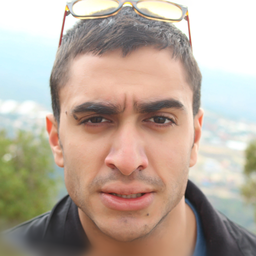
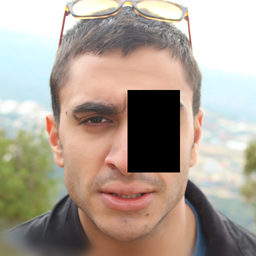
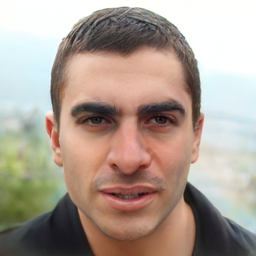
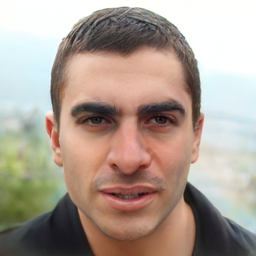

step  981/1000: percep_loss 0.24 latent_dist_reg 0.11 loss 0.30 
step  982/1000: percep_loss 0.24 latent_dist_reg 0.11 loss 0.30 
step  983/1000: percep_loss 0.24 latent_dist_reg 0.11 loss 0.30 
step  984/1000: percep_loss 0.24 latent_dist_reg 0.11 loss 0.30 
step  985/1000: percep_loss 0.24 latent_dist_reg 0.11 loss 0.30 
step  986/1000: percep_loss 0.24 latent_dist_reg 0.11 loss 0.30 
step  987/1000: percep_loss 0.24 latent_dist_reg 0.11 loss 0.30 
step  988/1000: percep_loss 0.24 latent_dist_reg 0.11 loss 0.30 
step  989/1000: percep_loss 0.24 latent_dist_reg 0.11 loss 0.30 
step  990/1000: percep_loss 0.24 latent_dist_reg 0.11 loss 0.30 
step  991/1000: percep_loss 0.24 latent_dist_reg 0.11 loss 0.30 
step  992/1000: percep_loss 0.24 latent_dist_reg 0.11 loss 0.30 
step  993/1000: percep_loss 0.24 latent_dist_reg 0.11 loss 0.30 
step  994/1000: percep_loss 0.24 latent_dist_reg 0.11 loss 0.30 
step  995/1000: percep_loss 0.24 latent_dist_reg 0.11 loss 0.30 
step  996/1000: percep_lo

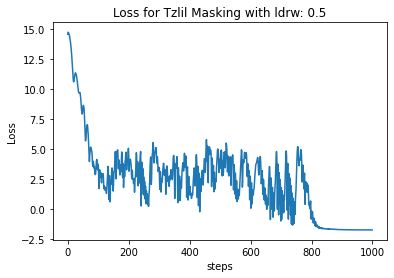

In [ ]:
## Tzlil's reconstruction:
tar = "/content/gdrive/MyDrive/input_img/Tzlil/africa_tzlil_aligned.png"
outdir = "/content/gdrive/MyDrive/input_img/Tzlil/Inpainting/with 1000 and 0.2"

tzlil_loss = invert_image(INPAINTING_DEGRADATION, tar,outdir, "Tzlil Masking",num_steps=1000,latent_dist_reg_weight=0.5)

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

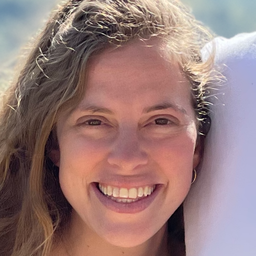
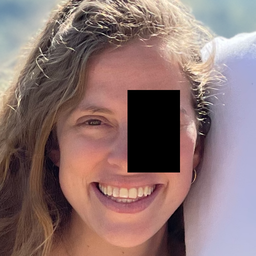
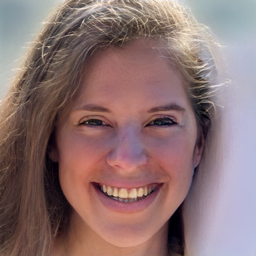
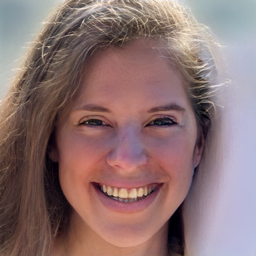

step  981/1000: percep_loss 0.24 latent_dist_reg 0.12 loss 0.30 
step  982/1000: percep_loss 0.24 latent_dist_reg 0.12 loss 0.30 
step  983/1000: percep_loss 0.24 latent_dist_reg 0.12 loss 0.30 
step  984/1000: percep_loss 0.24 latent_dist_reg 0.12 loss 0.30 
step  985/1000: percep_loss 0.24 latent_dist_reg 0.12 loss 0.30 
step  986/1000: percep_loss 0.24 latent_dist_reg 0.12 loss 0.30 
step  987/1000: percep_loss 0.24 latent_dist_reg 0.12 loss 0.30 
step  988/1000: percep_loss 0.24 latent_dist_reg 0.12 loss 0.30 
step  989/1000: percep_loss 0.24 latent_dist_reg 0.12 loss 0.30 
step  990/1000: percep_loss 0.24 latent_dist_reg 0.12 loss 0.30 
step  991/1000: percep_loss 0.24 latent_dist_reg 0.12 loss 0.30 
step  992/1000: percep_loss 0.24 latent_dist_reg 0.12 loss 0.30 
step  993/1000: percep_loss 0.24 latent_dist_reg 0.12 loss 0.30 
step  994/1000: percep_loss 0.24 latent_dist_reg 0.12 loss 0.30 
step  995/1000: percep_loss 0.24 latent_dist_reg 0.12 loss 0.30 
step  996/1000: percep_lo

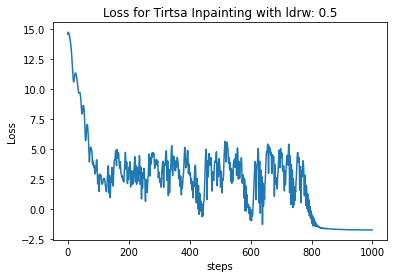

In [ ]:
## Tirtza's reconstruction:
tar = "/content/gdrive/MyDrive/input_img/Tirtsa/tir_aligned.png"
outdir = "/content/gdrive/MyDrive/input_img/Tirtsa/Inpainting/ with 800 and 0.001"

tirtz_loss = invert_image(INPAINTING_DEGRADATION, tar,outdir, "Tirtsa Inpainting",num_steps=1000,latent_dist_reg_weight=0.5)

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

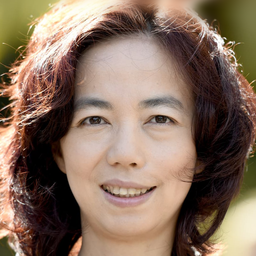
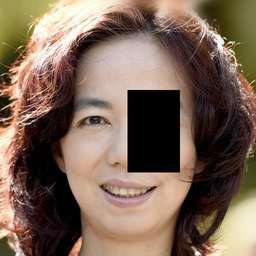
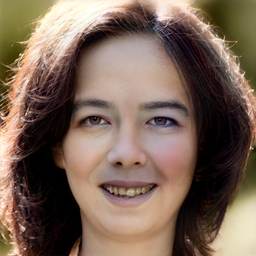
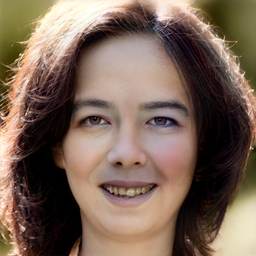

step  741/750: percep_loss 0.24 latent_dist_reg 1.04 loss 0.24 
step  742/750: percep_loss 0.24 latent_dist_reg 1.04 loss 0.24 
step  743/750: percep_loss 0.24 latent_dist_reg 1.04 loss 0.24 
step  744/750: percep_loss 0.24 latent_dist_reg 1.04 loss 0.24 
step  745/750: percep_loss 0.24 latent_dist_reg 1.04 loss 0.24 
step  746/750: percep_loss 0.24 latent_dist_reg 1.04 loss 0.24 
step  747/750: percep_loss 0.24 latent_dist_reg 1.04 loss 0.24 
step  748/750: percep_loss 0.24 latent_dist_reg 1.04 loss 0.24 
step  749/750: percep_loss 0.24 latent_dist_reg 1.04 loss 0.24 
step  750/750: percep_loss 0.24 latent_dist_reg 1.04 loss 0.24 
Elapsed: 140.5 s


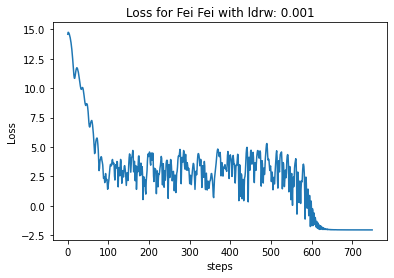

In [ ]:
## Fei Fei's Inpainting
tar = "/content/gdrive/MyDrive/input_img/inputs/fei_fei_li_original.png"
outdir = "/content/gdrive/MyDrive/input_img/fei/0.001"

fei_loss = invert_image(INPAINTING_DEGRADATION,tar,outdir,"Fei Fei",num_steps=750,latent_dist_reg_weight=0.001)

# GAN Inversion

In [ ]:
def run_latent_optimization(outdir,
    degradation_mode,
    G,
    imgs_to_disply_dict,
    target: torch.Tensor, # [C,H,W] and dynamic range [0,255], W & H must match G output resolution
    *,
    num_steps                  = 1000,
    w_avg_samples              = 10000,
    initial_learning_rate      = 0.1,
    initial_noise_factor       = 0.05,
    lr_rampdown_length         = 0.25,
    lr_rampup_length           = 0.05,
    noise_ramp_length          = 0.75,
    regularize_noise_weight    = 1e5,
    latent_dist_reg_weight     = 0.001,
    device: torch.device
    
):
    assert target.shape == (G.img_channels, G.img_resolution, G.img_resolution)

    G = copy.deepcopy(G).eval().requires_grad_(False).to(device) # type: ignore
  
    # Compute w stats.
    print(f'Computing W midpoint and stddev using {w_avg_samples} samples...')
    z_samples = np.random.RandomState(123).randn(w_avg_samples, G.z_dim)
    w_samples = G.mapping(torch.from_numpy(z_samples).to(device), None)  # [N, L, C]
    w_samples = w_samples.cpu().numpy().astype(np.float32)
    w_avg = np.mean(w_samples, axis=0, keepdims=True)      # [1, 18, C]
    w_avg_original = torch.from_numpy(w_avg).to(device).float()
    w_std = (np.sum((w_samples - w_avg) ** 2) / w_avg_samples) ** 0.5

    # Setup noise inputs.
    noise_bufs = { name: buf for (name, buf) in G.synthesis.named_buffers() if 'noise_const' in name }

    # Load VGG16 feature detector.
    url = 'https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/metrics/vgg16.pt'
    with dnnlib.util.open_url(url) as f:
        vgg16 = torch.jit.load(f).eval().to(device)
    
    # Features for target image.
    target_images = target.unsqueeze(0).to(device).to(torch.float32)

    if target_images.shape[2] > 256:
        target_images = F.interpolate(target_images, size=(256, 256), mode='area')
    target_features = vgg16(target_images, resize_images=False, return_lpips=True)

    w_opt = torch.tensor(w_avg, dtype=torch.float32, device=device, requires_grad=True) 
    w_out = torch.zeros([num_steps] + list(w_opt.shape[1:]), dtype=torch.float32, device=device)
    optimizer = torch.optim.Adam([w_opt] + list(noise_bufs.values()), betas=(0.9, 0.999), lr=initial_learning_rate)
    loss_plt = []

    # Init noise.
    for buf in noise_bufs.values():
        buf[:] = torch.randn_like(buf)
        buf.requires_grad = True

    for step in range(num_steps):
        # Learning rate schedule.
        t = step / num_steps
        w_noise_scale = w_std * initial_noise_factor * max(0.0, 1.0 - t / noise_ramp_length) ** 2
        lr_ramp = min(1.0, (1.0 - t) / lr_rampdown_length)
        lr_ramp = 0.5 - 0.5 * np.cos(lr_ramp * np.pi)
        lr_ramp = lr_ramp * min(1.0, t / lr_rampup_length)
        lr = initial_learning_rate * lr_ramp
        for param_group in optimizer.param_groups:
            param_group['lr'] = lr

        # Synth image from opt_w
        w_noise = torch.randn_like(w_opt) * w_noise_scale
        ws = w_opt + w_noise
        synth_images = G.synthesis(ws, noise_mode='const')
        
        # Prep to save synth image
        synth_image_save = (synth_images + 1) * (255/2)
        synth_image_save = synth_image_save.permute(0, 2, 3, 1).clamp(0, 255).to(torch.uint8)[0].cpu().numpy()
    
        # ********************************************************************************************************
        # ******************                   NEED TO FILL IN THE FOLLOWING CODE               ******************
        # ********************************************************************************************************
        
        # if  degradation_mode == INPAINTING_DEGRADATION:
        #   synth_images = inpainting_mode(synth_images).float()
        
        if degradation_mode == GRAYSCALE_DEGRADATION:
          synth_images = grayscale_mode(synth_images)

        elif degradation_mode == GAUSSIAN_BLUR_DEGRADATION:
          synth_images = blur_mode(synth_images)


        # ********************************************************************************************************
        # ******************                          END CODE TO ADD SECTION                   ******************
        # ********************************************************************************************************
         
        # Prep to save and show images
        synth_image_degraded_save = (synth_images + 1) * (255/2)
        #################################################
        ############## NOT ORIGINAL PLACE ###############
        #################################################  
        if  degradation_mode == INPAINTING_DEGRADATION:
          synth_images = inpainting_mode(synth_images)
          #####   Uncomment if you wish to see the degradation of the generated image  ######
          # synth_image_degraded_save = inpainting_mode(synth_image_degraded_save)


        synth_image_degraded_save = synth_image_degraded_save.permute(0, 2, 3, 1).clamp(0, 255).to(torch.uint8)[0].cpu().numpy()  


        if step % 20 == 0:
          imgs_to_disply_dict["Generated Image"]=synth_image_save
          imgs_to_disply_dict["Generated Degraded Image"]=synth_image_degraded_save
          clear_output(wait=True)
          media.show_images(imgs_to_disply_dict,height=256)
        if step % 100 == 0:
          PIL.Image.fromarray(synth_image_save, 'RGB').save(f'{outdir}/intermidiate_%d_not_degraded.png'%step)
          PIL.Image.fromarray(synth_image_degraded_save, 'RGB').save(f'{outdir}/intermidiate_%d_degraded.png'%step)


        # Noise regularization.
        reg_loss = 0.0
        for v in noise_bufs.values():
            noise = v[None,None,:,:] # must be [1,1,H,W] for F.avg_pool2d()
            while True:
                reg_loss += (noise*torch.roll(noise, shifts=1, dims=3)).mean()**2
                reg_loss += (noise*torch.roll(noise, shifts=1, dims=2)).mean()**2
                if noise.shape[2] <= 8:
                    break
                noise = F.avg_pool2d(noise, kernel_size=2)

        # Downsample image to 256x256 if it's larger than that. VGG was built for 224x224 images.
        synth_images = (synth_images + 1) * (255/2)

        if synth_images.shape[2] > 256:
            synth_images = F.interpolate(synth_images, size=(256, 256), mode='area')

        # Features for synth images.
        synth_features = vgg16(synth_images.to('cuda'), resize_images=False, return_lpips=True)
        
        # Compute loss
        percep_loss = (target_features - synth_features).square().sum()
        latent_dist_reg = F.l1_loss(w_avg_original, w_opt)
        loss = percep_loss + reg_loss * regularize_noise_weight  + latent_dist_reg_weight * latent_dist_reg


        # Step
        optimizer.zero_grad(set_to_none=True)
        loss.backward()
        optimizer.step()
        loss_plt.append(loss)


        print(f'step {step+1:>4d}/{num_steps}: percep_loss {percep_loss:<4.2f} latent_dist_reg {latent_dist_reg:<4.2f} loss {float(loss):<5.2f}' )

        # Save inverted latent for each optimization step.
        w_out[step] = w_opt.detach()[0]

        # Normalize noise.
        with torch.no_grad():
            for buf in noise_bufs.values():
                buf -= buf.mean()
                buf *= buf.square().mean().rsqrt()
    return w_out, loss_plt

In [ ]:

def invert_image(degradation_mode,
                   target_fname,
                   outdir,
                   title=None,
                   seed=303,
                   num_steps=1000,
                   latent_dist_reg_weight=0.001,
                   is_input_degraded=False
                 ):
    np.random.seed(seed)
    torch.manual_seed(seed)

    # Load networks.
    print('Loading networks from "%s"...' % CHECKPOINTS_PATH)
    device = torch.device('cuda')
    with dnnlib.util.open_url(CHECKPOINTS_PATH) as fp:
        networks = legacy.load_network_pkl(fp)
        G = networks['G_ema'].requires_grad_(False).to(device)
        

    # Load target image.
    if not os.path.exists(outdir):
      os.makedirs(outdir)
    target_pil = PIL.Image.open(target_fname).convert('RGB')
    w, h = target_pil.size
    s = min(w, h)
    target_pil = target_pil.crop(((w - s) // 2, (h - s) // 2, (w + s) // 2, (h + s) // 2))
    target_pil = target_pil.resize((G.img_resolution, G.img_resolution), PIL.Image.LANCZOS)
    target_uint8 = np.array(target_pil, dtype=np.uint8)
    target=torch.tensor(target_uint8.transpose([2, 0, 1]), device=device), 
    target_images = target[0].unsqueeze(0).to(device).to(torch.float32)

    # ********************************************************************************************************
    # ******************                   NEED TO FILL IN THE FOLLOWING CODE               ******************
    # ********************************************************************************************************
    if not is_input_degraded:
      if  degradation_mode == INPAINTING_DEGRADATION:
        target_images = inpainting_mode(target_images)

      elif degradation_mode == GRAYSCALE_DEGRADATION:
        target_images = grayscale_mode(target_images[0])[None]
        
      elif degradation_mode == GAUSSIAN_BLUR_DEGRADATION:
        target_images = blur_mode(target[0].float().unsqueeze(0))

        
        


    # ********************************************************************************************************
    # ******************                          END CODE TO ADD SECTION                   ******************
    # ********************************************************************************************************

    #Save target image
    target_to_save = target_images.permute(0, 2, 3, 1).clamp(0, 255).to(torch.uint8)[0].cpu().numpy()
    PIL.Image.fromarray(target_to_save, 'RGB').save(f'{outdir}/original_degraded_image.png')
    imgs_to_disply_dict = {
        "Original Image":target_uint8,
        "Original Degraded Image":target_to_save,
              }

    # Run latent optimization
    start_time = perf_counter()
    optimization_steps, loss_data = run_latent_optimization(
        outdir,
        degradation_mode,
        G,
        imgs_to_disply_dict,
        target[0],
        num_steps=num_steps,
        device=device,
        latent_dist_reg_weight=latent_dist_reg_weight
    )
    plt.plot(np.arange(num_steps), np.array(np.log2(loss_data)))
    plt.title(f'Loss for {title} with ldrw: {latent_dist_reg_weight}')
    plt.xlabel('steps')
    plt.ylabel('Loss')
    plt.savefig(f'{title} with steps {num_steps} and ldrw {latent_dist_reg_weight}.png', bbox_inches='tight')
    
 
    print (f'Elapsed: {(perf_counter()-start_time):.1f} s')
    os.makedirs(outdir, exist_ok=True)

    # Save final inverted image and latent vector.
    inverted_latent = optimization_steps[-1]
    synth_image = G.synthesis(inverted_latent.unsqueeze(0), noise_mode='const')
    synth_image = (synth_image + 1) * (255/2)
    synth_image = synth_image.permute(0, 2, 3, 1).clamp(0, 255).to(torch.uint8)[0].cpu().numpy()
    PIL.Image.fromarray(synth_image, 'RGB').save(f'{outdir}/final_inverted_image.png')
    np.savez(f'{outdir}/inverted_latent.npz', latent=inverted_latent.unsqueeze(0).cpu().numpy())
    return loss_data

**Colorization**

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

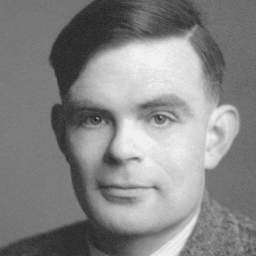
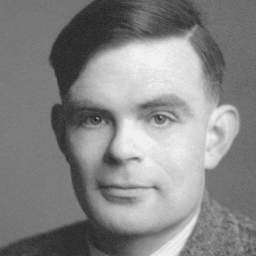
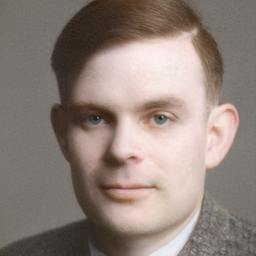
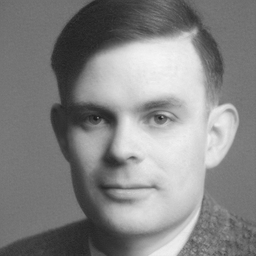

step  481/500: percep_loss 0.15 latent_dist_reg 0.09 loss 0.19 
step  482/500: percep_loss 0.15 latent_dist_reg 0.09 loss 0.19 
step  483/500: percep_loss 0.15 latent_dist_reg 0.09 loss 0.19 
step  484/500: percep_loss 0.15 latent_dist_reg 0.09 loss 0.19 
step  485/500: percep_loss 0.15 latent_dist_reg 0.09 loss 0.19 
step  486/500: percep_loss 0.15 latent_dist_reg 0.09 loss 0.19 
step  487/500: percep_loss 0.15 latent_dist_reg 0.09 loss 0.19 
step  488/500: percep_loss 0.15 latent_dist_reg 0.09 loss 0.19 
step  489/500: percep_loss 0.15 latent_dist_reg 0.09 loss 0.19 
step  490/500: percep_loss 0.15 latent_dist_reg 0.09 loss 0.19 
step  491/500: percep_loss 0.15 latent_dist_reg 0.09 loss 0.19 
step  492/500: percep_loss 0.15 latent_dist_reg 0.09 loss 0.19 
step  493/500: percep_loss 0.15 latent_dist_reg 0.09 loss 0.19 
step  494/500: percep_loss 0.15 latent_dist_reg 0.09 loss 0.19 
step  495/500: percep_loss 0.15 latent_dist_reg 0.09 loss 0.19 
step  496/500: percep_loss 0.15 latent_d

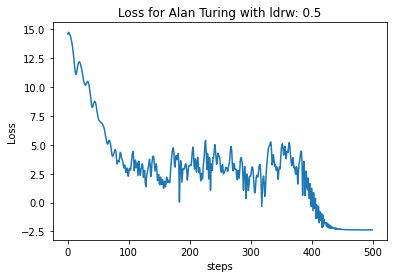

In [ ]:
## Alan Turing's Colorization
tar = "/content/gdrive/MyDrive/input_img/inputs/alan_turing_grayscale.png"
outdir = "/content/gdrive/MyDrive/input_img/Alan"

alan_loss = invert_image(GRAYSCALE_DEGRADATION, tar,outdir, 'Alan Turing',num_steps=500,latent_dist_reg_weight=0.5 ,is_input_degraded=True)


Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

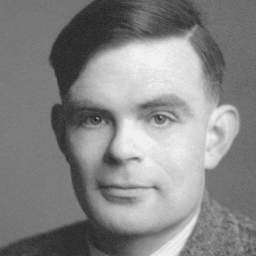
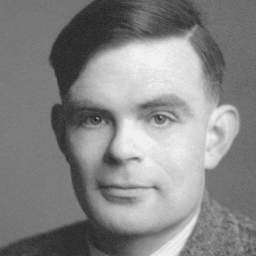
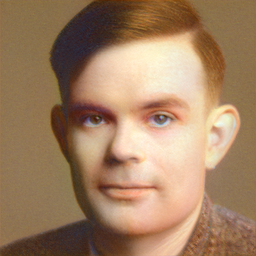
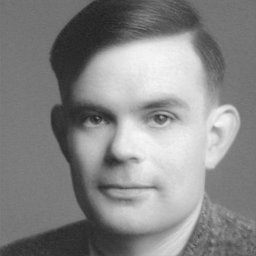

step  481/500: percep_loss 0.13 latent_dist_reg 0.76 loss 0.14 
step  482/500: percep_loss 0.13 latent_dist_reg 0.76 loss 0.14 
step  483/500: percep_loss 0.13 latent_dist_reg 0.76 loss 0.14 
step  484/500: percep_loss 0.13 latent_dist_reg 0.76 loss 0.14 
step  485/500: percep_loss 0.13 latent_dist_reg 0.76 loss 0.14 
step  486/500: percep_loss 0.13 latent_dist_reg 0.76 loss 0.14 
step  487/500: percep_loss 0.13 latent_dist_reg 0.76 loss 0.14 
step  488/500: percep_loss 0.13 latent_dist_reg 0.76 loss 0.14 
step  489/500: percep_loss 0.13 latent_dist_reg 0.76 loss 0.14 
step  490/500: percep_loss 0.13 latent_dist_reg 0.76 loss 0.14 
step  491/500: percep_loss 0.13 latent_dist_reg 0.76 loss 0.14 
step  492/500: percep_loss 0.13 latent_dist_reg 0.76 loss 0.14 
step  493/500: percep_loss 0.13 latent_dist_reg 0.76 loss 0.14 
step  494/500: percep_loss 0.13 latent_dist_reg 0.76 loss 0.14 
step  495/500: percep_loss 0.13 latent_dist_reg 0.76 loss 0.14 
step  496/500: percep_loss 0.13 latent_d

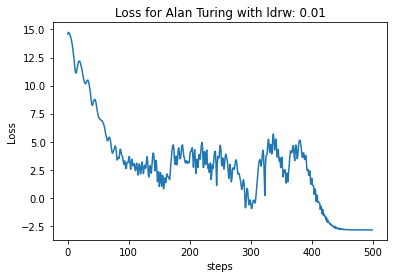

In [ ]:
## Alan Turing's Colorization
tar = "/content/gdrive/MyDrive/input_img/inputs/alan_turing_grayscale.png"
outdir = "/content/gdrive/MyDrive/input_img/Alan/with\ 500\ and\ 0.01"

alan_loss = invert_image(GRAYSCALE_DEGRADATION, tar,outdir, 'Alan Turing',num_steps=500,latent_dist_reg_weight=0.01 ,is_input_degraded=True)



Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

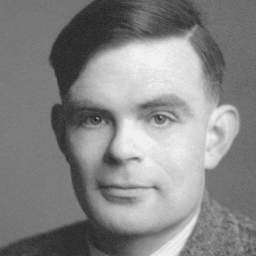
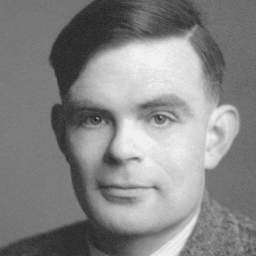
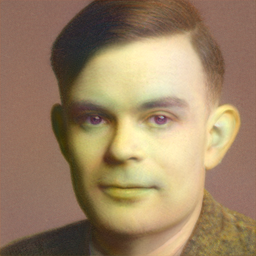
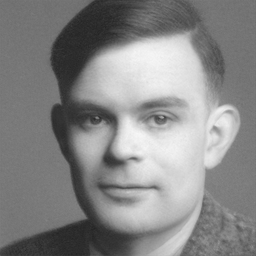

step  581/600: percep_loss 0.12 latent_dist_reg 0.91 loss 0.12 
step  582/600: percep_loss 0.12 latent_dist_reg 0.91 loss 0.12 
step  583/600: percep_loss 0.12 latent_dist_reg 0.91 loss 0.12 
step  584/600: percep_loss 0.12 latent_dist_reg 0.91 loss 0.12 
step  585/600: percep_loss 0.12 latent_dist_reg 0.91 loss 0.12 
step  586/600: percep_loss 0.12 latent_dist_reg 0.91 loss 0.12 
step  587/600: percep_loss 0.12 latent_dist_reg 0.91 loss 0.12 
step  588/600: percep_loss 0.12 latent_dist_reg 0.91 loss 0.12 
step  589/600: percep_loss 0.12 latent_dist_reg 0.91 loss 0.12 
step  590/600: percep_loss 0.12 latent_dist_reg 0.91 loss 0.12 
step  591/600: percep_loss 0.12 latent_dist_reg 0.91 loss 0.12 
step  592/600: percep_loss 0.12 latent_dist_reg 0.91 loss 0.12 
step  593/600: percep_loss 0.12 latent_dist_reg 0.91 loss 0.12 
step  594/600: percep_loss 0.12 latent_dist_reg 0.91 loss 0.12 
step  595/600: percep_loss 0.12 latent_dist_reg 0.91 loss 0.12 
step  596/600: percep_loss 0.12 latent_d

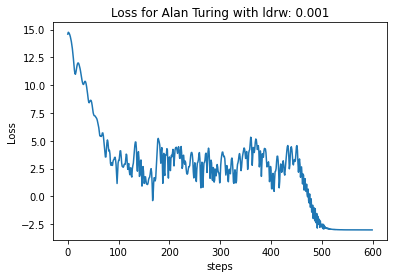

In [ ]:
## Alan Turing's Colorization
tar = "/content/gdrive/MyDrive/input_img/inputs/alan_turing_grayscale.png"
outdir = "/content/gdrive/MyDrive/input_img/Alan/with\ 600\ and\ 0.001"

alan_loss = invert_image(GRAYSCALE_DEGRADATION, tar,outdir, 'Alan Turing',num_steps=600,latent_dist_reg_weight=0.001 ,is_input_degraded=True)



Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

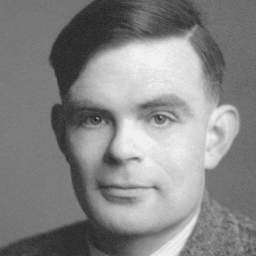
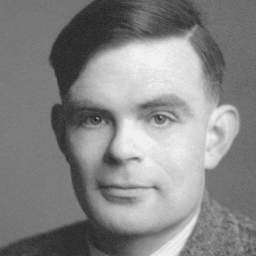
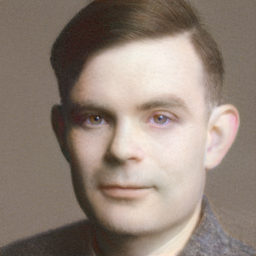
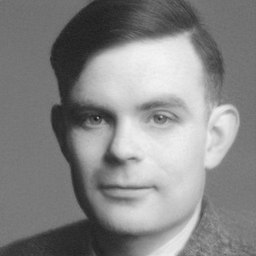

step  681/700: percep_loss 0.13 latent_dist_reg 0.16 loss 0.16 
step  682/700: percep_loss 0.13 latent_dist_reg 0.16 loss 0.16 
step  683/700: percep_loss 0.13 latent_dist_reg 0.16 loss 0.16 
step  684/700: percep_loss 0.13 latent_dist_reg 0.16 loss 0.16 
step  685/700: percep_loss 0.13 latent_dist_reg 0.16 loss 0.16 
step  686/700: percep_loss 0.13 latent_dist_reg 0.16 loss 0.16 
step  687/700: percep_loss 0.13 latent_dist_reg 0.16 loss 0.16 
step  688/700: percep_loss 0.13 latent_dist_reg 0.16 loss 0.16 
step  689/700: percep_loss 0.13 latent_dist_reg 0.16 loss 0.16 
step  690/700: percep_loss 0.13 latent_dist_reg 0.16 loss 0.16 
step  691/700: percep_loss 0.13 latent_dist_reg 0.16 loss 0.16 
step  692/700: percep_loss 0.13 latent_dist_reg 0.16 loss 0.16 
step  693/700: percep_loss 0.13 latent_dist_reg 0.16 loss 0.16 
step  694/700: percep_loss 0.13 latent_dist_reg 0.16 loss 0.16 
step  695/700: percep_loss 0.13 latent_dist_reg 0.16 loss 0.16 
step  696/700: percep_loss 0.13 latent_d

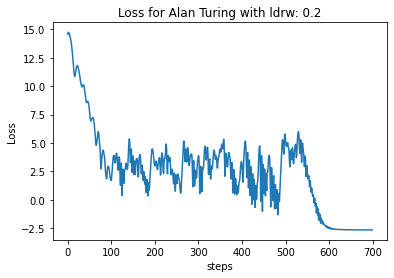

In [ ]:
## Alan Turing's Colorization
tar = "/content/gdrive/MyDrive/input_img/inputs/alan_turing_grayscale.png"
outdir = "/content/gdrive/MyDrive/input_img/Alan/with\ 1500\ and\ 0.2"

alan_loss = invert_image(GRAYSCALE_DEGRADATION, tar,outdir, 'Alan Turing',num_steps=700,latent_dist_reg_weight=0.2 ,is_input_degraded=True)



Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

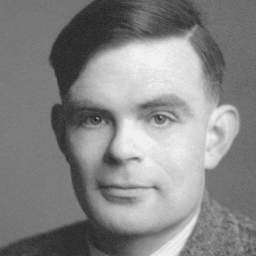
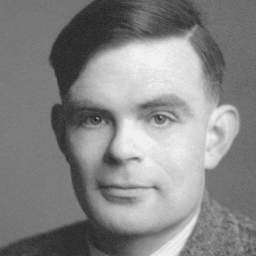
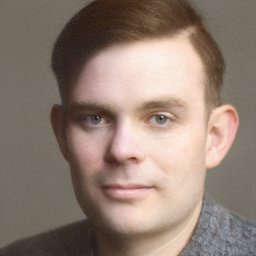
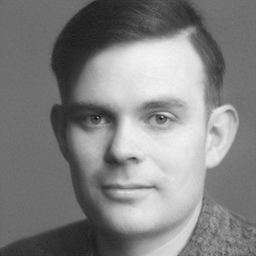

step 1481/1500: percep_loss 0.15 latent_dist_reg 0.06 loss 0.20 
step 1482/1500: percep_loss 0.15 latent_dist_reg 0.06 loss 0.20 
step 1483/1500: percep_loss 0.15 latent_dist_reg 0.06 loss 0.20 
step 1484/1500: percep_loss 0.15 latent_dist_reg 0.06 loss 0.20 
step 1485/1500: percep_loss 0.15 latent_dist_reg 0.06 loss 0.20 
step 1486/1500: percep_loss 0.15 latent_dist_reg 0.06 loss 0.20 
step 1487/1500: percep_loss 0.15 latent_dist_reg 0.06 loss 0.20 
step 1488/1500: percep_loss 0.15 latent_dist_reg 0.06 loss 0.20 
step 1489/1500: percep_loss 0.15 latent_dist_reg 0.06 loss 0.20 
step 1490/1500: percep_loss 0.15 latent_dist_reg 0.06 loss 0.20 
step 1491/1500: percep_loss 0.15 latent_dist_reg 0.06 loss 0.20 
step 1492/1500: percep_loss 0.15 latent_dist_reg 0.06 loss 0.20 
step 1493/1500: percep_loss 0.15 latent_dist_reg 0.06 loss 0.20 
step 1494/1500: percep_loss 0.15 latent_dist_reg 0.06 loss 0.20 
step 1495/1500: percep_loss 0.15 latent_dist_reg 0.06 loss 0.20 
step 1496/1500: percep_lo

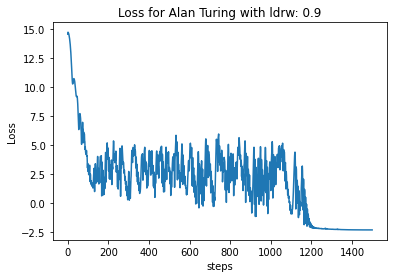

In [ ]:
## Alan Turing's Colorization
tar = "/content/gdrive/MyDrive/input_img/inputs/alan_turing_grayscale.png"
outdir = "/content/gdrive/MyDrive/input_img/Alan/with\ 1500\ and\ 0.01"

alan_loss = invert_image(GRAYSCALE_DEGRADATION, tar,outdir, 'Alan Turing',num_steps=1500,latent_dist_reg_weight=0.9 ,is_input_degraded=True)



Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

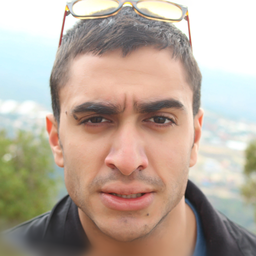
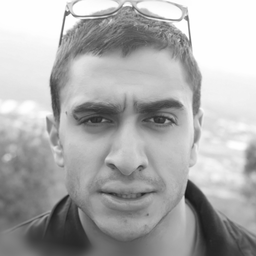
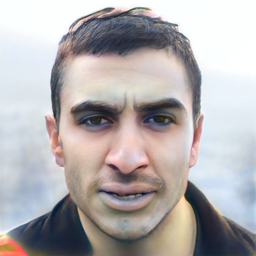
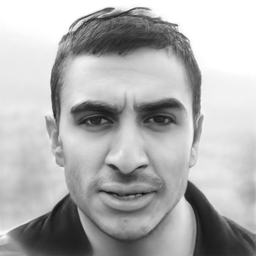

step  881/900: percep_loss 0.28 latent_dist_reg 0.27 loss 0.31 
step  882/900: percep_loss 0.28 latent_dist_reg 0.27 loss 0.31 
step  883/900: percep_loss 0.28 latent_dist_reg 0.27 loss 0.31 
step  884/900: percep_loss 0.28 latent_dist_reg 0.27 loss 0.31 
step  885/900: percep_loss 0.28 latent_dist_reg 0.27 loss 0.31 
step  886/900: percep_loss 0.28 latent_dist_reg 0.27 loss 0.31 
step  887/900: percep_loss 0.28 latent_dist_reg 0.27 loss 0.31 
step  888/900: percep_loss 0.28 latent_dist_reg 0.27 loss 0.31 
step  889/900: percep_loss 0.28 latent_dist_reg 0.27 loss 0.31 
step  890/900: percep_loss 0.28 latent_dist_reg 0.27 loss 0.31 
step  891/900: percep_loss 0.28 latent_dist_reg 0.27 loss 0.31 
step  892/900: percep_loss 0.28 latent_dist_reg 0.27 loss 0.31 
step  893/900: percep_loss 0.28 latent_dist_reg 0.27 loss 0.31 
step  894/900: percep_loss 0.28 latent_dist_reg 0.27 loss 0.31 
step  895/900: percep_loss 0.28 latent_dist_reg 0.27 loss 0.31 
step  896/900: percep_loss 0.28 latent_d

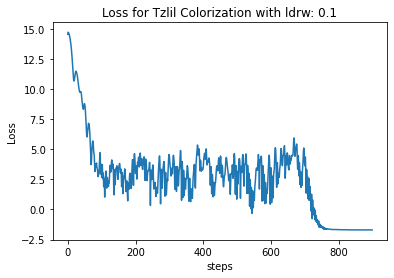

In [ ]:
## Tzlil's Colorization:
tar = "/content/gdrive/MyDrive/input_img/Tzlil/africa_tzlil_aligned.png"
outdir = "/content/gdrive/MyDrive/input_img/Tzlil/colorization/with 900 and 0.1"

tzlil_loss = invert_image(GRAYSCALE_DEGRADATION, tar,outdir, "Tzlil Colorization", num_steps=900, latent_dist_reg_weight=0.1)

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

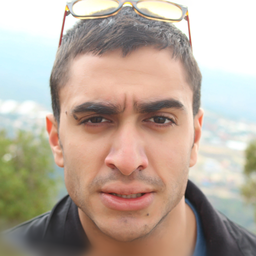
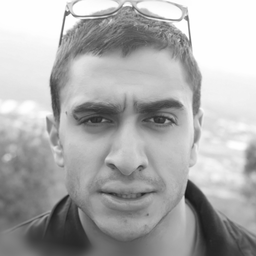
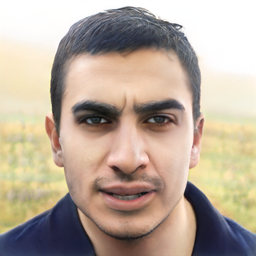
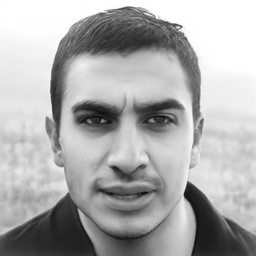

step 1181/1200: percep_loss 0.32 latent_dist_reg 0.09 loss 0.36 
step 1182/1200: percep_loss 0.32 latent_dist_reg 0.09 loss 0.36 
step 1183/1200: percep_loss 0.32 latent_dist_reg 0.09 loss 0.36 
step 1184/1200: percep_loss 0.32 latent_dist_reg 0.09 loss 0.36 
step 1185/1200: percep_loss 0.32 latent_dist_reg 0.09 loss 0.36 
step 1186/1200: percep_loss 0.32 latent_dist_reg 0.09 loss 0.36 
step 1187/1200: percep_loss 0.32 latent_dist_reg 0.09 loss 0.36 
step 1188/1200: percep_loss 0.32 latent_dist_reg 0.09 loss 0.36 
step 1189/1200: percep_loss 0.32 latent_dist_reg 0.09 loss 0.36 
step 1190/1200: percep_loss 0.32 latent_dist_reg 0.09 loss 0.36 
step 1191/1200: percep_loss 0.32 latent_dist_reg 0.09 loss 0.36 
step 1192/1200: percep_loss 0.32 latent_dist_reg 0.09 loss 0.36 
step 1193/1200: percep_loss 0.32 latent_dist_reg 0.09 loss 0.36 
step 1194/1200: percep_loss 0.32 latent_dist_reg 0.09 loss 0.36 
step 1195/1200: percep_loss 0.32 latent_dist_reg 0.09 loss 0.36 
step 1196/1200: percep_lo

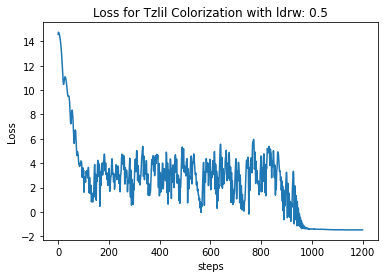

In [ ]:
## Tzlil's Colorization:
tar = "/content/gdrive/MyDrive/input_img/Tzlil/africa_tzlil_aligned.png"
outdir = "/content/gdrive/MyDrive/input_img/Tzlil/colorization/with 900 and 0.5"

tzlil_loss = invert_image(GRAYSCALE_DEGRADATION, tar,outdir, "Tzlil Colorization", num_steps=1200, latent_dist_reg_weight=0.5)

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

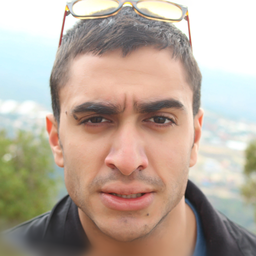
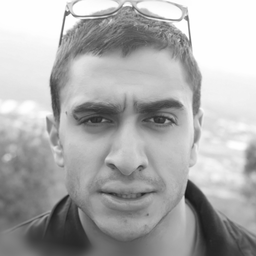
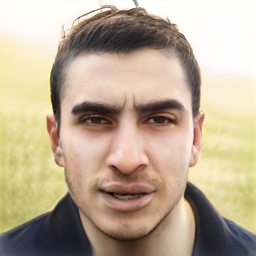
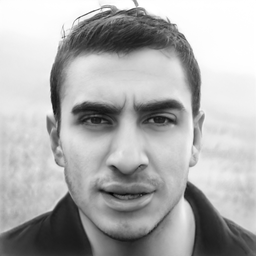

step  881/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.33 
step  882/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.33 
step  883/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.33 
step  884/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.33 
step  885/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.33 
step  886/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.33 
step  887/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.33 
step  888/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.33 
step  889/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.33 
step  890/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.33 
step  891/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.33 
step  892/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.33 
step  893/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.33 
step  894/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.33 
step  895/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.33 
step  896/900: percep_loss 0.30 latent_d

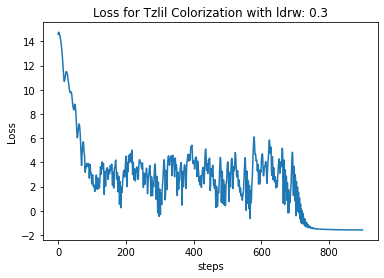

In [ ]:
## Tzlil's Colorization:
tar = "/content/gdrive/MyDrive/input_img/Tzlil/africa_tzlil_aligned.png"
outdir = "/content/gdrive/MyDrive/input_img/Tzlil/colorization/with 900 and 0.3"

tzlil_loss = invert_image(GRAYSCALE_DEGRADATION, tar,outdir, "Tzlil Colorization", num_steps=900, latent_dist_reg_weight=0.3)

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

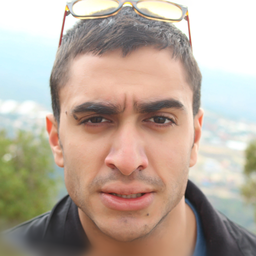
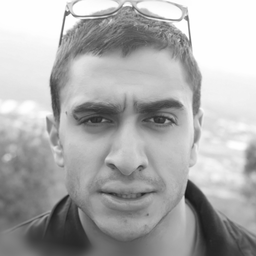
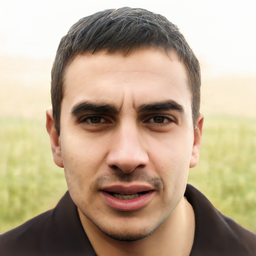
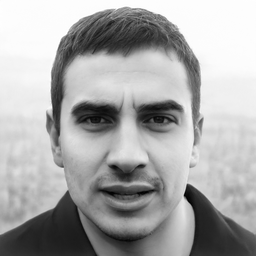

step  981/1000: percep_loss 0.35 latent_dist_reg 0.04 loss 0.40 
step  982/1000: percep_loss 0.35 latent_dist_reg 0.04 loss 0.40 
step  983/1000: percep_loss 0.35 latent_dist_reg 0.04 loss 0.40 
step  984/1000: percep_loss 0.35 latent_dist_reg 0.04 loss 0.40 
step  985/1000: percep_loss 0.35 latent_dist_reg 0.04 loss 0.40 
step  986/1000: percep_loss 0.35 latent_dist_reg 0.04 loss 0.40 
step  987/1000: percep_loss 0.35 latent_dist_reg 0.04 loss 0.40 
step  988/1000: percep_loss 0.35 latent_dist_reg 0.04 loss 0.40 
step  989/1000: percep_loss 0.35 latent_dist_reg 0.04 loss 0.40 
step  990/1000: percep_loss 0.35 latent_dist_reg 0.04 loss 0.40 
step  991/1000: percep_loss 0.35 latent_dist_reg 0.04 loss 0.40 
step  992/1000: percep_loss 0.35 latent_dist_reg 0.04 loss 0.40 
step  993/1000: percep_loss 0.35 latent_dist_reg 0.04 loss 0.39 
step  994/1000: percep_loss 0.35 latent_dist_reg 0.04 loss 0.39 
step  995/1000: percep_loss 0.35 latent_dist_reg 0.04 loss 0.39 
step  996/1000: percep_lo

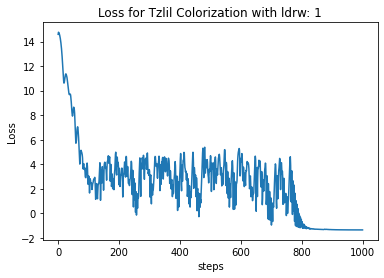

In [ ]:
## Tzlil's Colorization:
tar = "/content/gdrive/MyDrive/input_img/Tzlil/africa_tzlil_aligned.png"
outdir = "/content/gdrive/MyDrive/input_img/Tzlil/colorization/with 1000 and 1"

tzlil_loss = invert_image(GRAYSCALE_DEGRADATION, tar,outdir, "Tzlil Colorization", num_steps=1000, latent_dist_reg_weight=1)

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

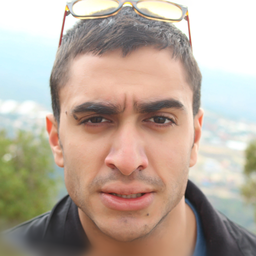
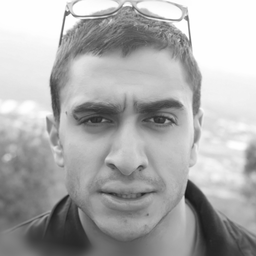
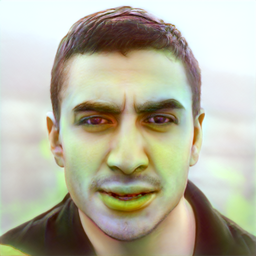
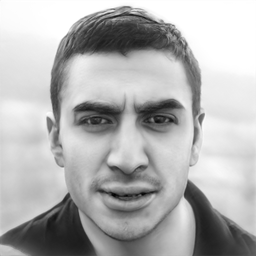

step  881/900: percep_loss 0.29 latent_dist_reg 1.07 loss 0.29 
step  882/900: percep_loss 0.29 latent_dist_reg 1.07 loss 0.29 
step  883/900: percep_loss 0.29 latent_dist_reg 1.07 loss 0.29 
step  884/900: percep_loss 0.29 latent_dist_reg 1.07 loss 0.29 
step  885/900: percep_loss 0.29 latent_dist_reg 1.07 loss 0.29 
step  886/900: percep_loss 0.29 latent_dist_reg 1.07 loss 0.29 
step  887/900: percep_loss 0.29 latent_dist_reg 1.07 loss 0.29 
step  888/900: percep_loss 0.29 latent_dist_reg 1.07 loss 0.29 
step  889/900: percep_loss 0.29 latent_dist_reg 1.07 loss 0.29 
step  890/900: percep_loss 0.29 latent_dist_reg 1.07 loss 0.29 
step  891/900: percep_loss 0.29 latent_dist_reg 1.07 loss 0.29 
step  892/900: percep_loss 0.29 latent_dist_reg 1.07 loss 0.29 
step  893/900: percep_loss 0.29 latent_dist_reg 1.07 loss 0.29 
step  894/900: percep_loss 0.29 latent_dist_reg 1.07 loss 0.29 
step  895/900: percep_loss 0.29 latent_dist_reg 1.07 loss 0.29 
step  896/900: percep_loss 0.29 latent_d

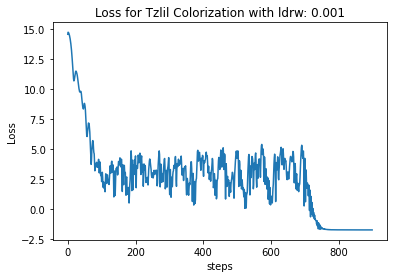

In [ ]:
## Tzlil's Colorization:
tar = "/content/gdrive/MyDrive/input_img/Tzlil/africa_tzlil_aligned.png"
outdir = "/content/gdrive/MyDrive/input_img/Tzlil/colorization/with 900 and 0.001"

tzlil_loss = invert_image(GRAYSCALE_DEGRADATION, tar,outdir, "Tzlil Colorization", num_steps=900, latent_dist_reg_weight=0.001)

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

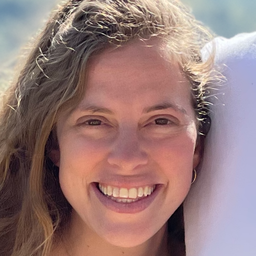
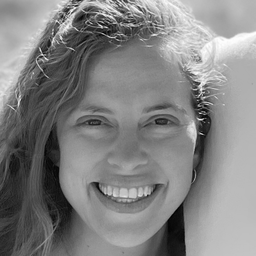
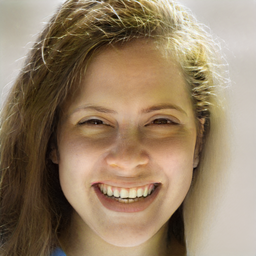
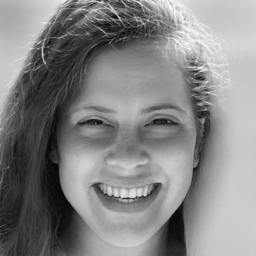

step  881/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.35 
step  882/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.35 
step  883/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.35 
step  884/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.35 
step  885/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.35 
step  886/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.35 
step  887/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.35 
step  888/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.35 
step  889/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.35 
step  890/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.35 
step  891/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.35 
step  892/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.35 
step  893/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.35 
step  894/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.35 
step  895/900: percep_loss 0.30 latent_dist_reg 0.12 loss 0.35 
step  896/900: percep_loss 0.30 latent_d

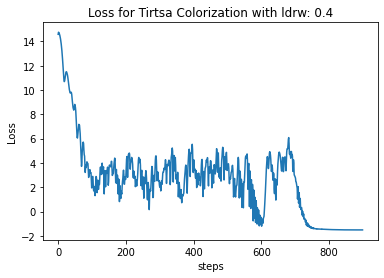

In [ ]:
## Tirtza's Colorization:
tar = "/content/gdrive/MyDrive/input_img/Tirtsa/tir_aligned.png"
outdir = "/content/gdrive/MyDrive/input_img/Tirtsa/colorization/with 900 and 0.4 "

tirtz_loss = invert_image(GRAYSCALE_DEGRADATION, tar,outdir, "Tirtsa Colorization",num_steps=900,latent_dist_reg_weight=0.4)

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

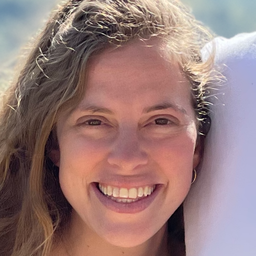
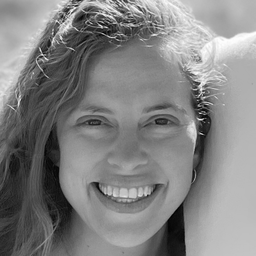
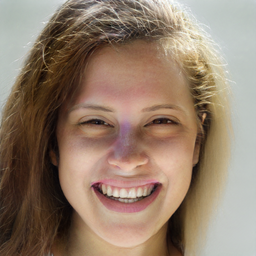
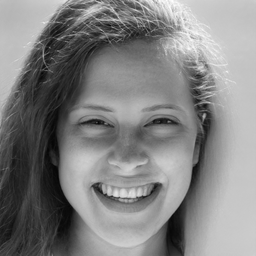

step  881/900: percep_loss 0.32 latent_dist_reg 0.08 loss 0.37 
step  882/900: percep_loss 0.32 latent_dist_reg 0.08 loss 0.37 
step  883/900: percep_loss 0.32 latent_dist_reg 0.08 loss 0.37 
step  884/900: percep_loss 0.32 latent_dist_reg 0.08 loss 0.37 
step  885/900: percep_loss 0.32 latent_dist_reg 0.08 loss 0.37 
step  886/900: percep_loss 0.32 latent_dist_reg 0.08 loss 0.37 
step  887/900: percep_loss 0.32 latent_dist_reg 0.08 loss 0.37 
step  888/900: percep_loss 0.32 latent_dist_reg 0.08 loss 0.37 
step  889/900: percep_loss 0.32 latent_dist_reg 0.08 loss 0.37 
step  890/900: percep_loss 0.32 latent_dist_reg 0.08 loss 0.37 
step  891/900: percep_loss 0.32 latent_dist_reg 0.08 loss 0.37 
step  892/900: percep_loss 0.32 latent_dist_reg 0.08 loss 0.37 
step  893/900: percep_loss 0.32 latent_dist_reg 0.08 loss 0.37 
step  894/900: percep_loss 0.32 latent_dist_reg 0.08 loss 0.37 
step  895/900: percep_loss 0.32 latent_dist_reg 0.08 loss 0.37 
step  896/900: percep_loss 0.32 latent_d

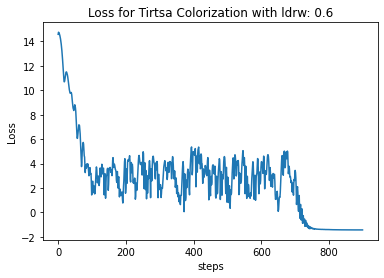

In [ ]:
## Tirtza's Colorization:
tar = "/content/gdrive/MyDrive/input_img/Tirtsa/tir_aligned.png"
outdir = "/content/gdrive/MyDrive/input_img/Tirtsa/colorization/with 900 and 0.6 "

tirtz_loss = invert_image(GRAYSCALE_DEGRADATION, tar,outdir, "Tirtsa Colorization",num_steps=900,latent_dist_reg_weight=0.6)

**Deblurring**

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

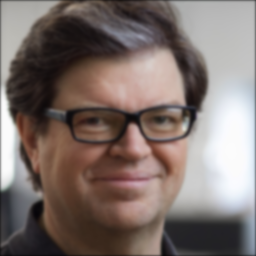
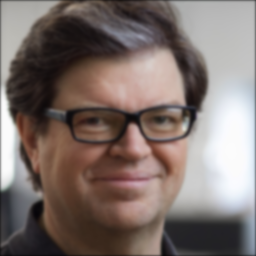
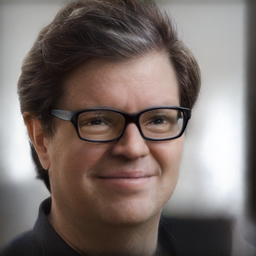
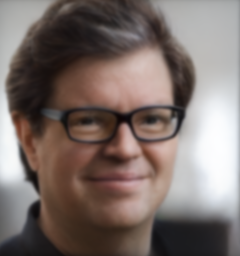

step  681/700: percep_loss 0.11 latent_dist_reg 0.12 loss 0.17 
torch.Size([1, 3, 1084, 1024])
step  682/700: percep_loss 0.11 latent_dist_reg 0.12 loss 0.17 
torch.Size([1, 3, 1084, 1024])
step  683/700: percep_loss 0.11 latent_dist_reg 0.12 loss 0.17 
torch.Size([1, 3, 1084, 1024])
step  684/700: percep_loss 0.11 latent_dist_reg 0.12 loss 0.17 
torch.Size([1, 3, 1084, 1024])
step  685/700: percep_loss 0.11 latent_dist_reg 0.12 loss 0.17 
torch.Size([1, 3, 1084, 1024])
step  686/700: percep_loss 0.11 latent_dist_reg 0.12 loss 0.17 
torch.Size([1, 3, 1084, 1024])
step  687/700: percep_loss 0.11 latent_dist_reg 0.12 loss 0.17 
torch.Size([1, 3, 1084, 1024])
step  688/700: percep_loss 0.11 latent_dist_reg 0.12 loss 0.17 
torch.Size([1, 3, 1084, 1024])
step  689/700: percep_loss 0.11 latent_dist_reg 0.12 loss 0.17 
torch.Size([1, 3, 1084, 1024])
step  690/700: percep_loss 0.11 latent_dist_reg 0.12 loss 0.17 
torch.Size([1, 3, 1084, 1024])
step  691/700: percep_loss 0.11 latent_dist_reg 0.

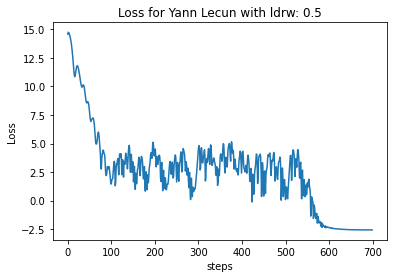

In [ ]:
## Yann Lecun's Deblurring
tar = "/content/gdrive/MyDrive/input_img/inputs/yann_lecun_blur.png"
outdir = "/content/gdrive/MyDrive/input_img/yann/with 700 and 0.5"

yann_loss = invert_image(GAUSSIAN_BLUR_DEGRADATION, tar,outdir,'Yann Lecun' ,num_steps=700,latent_dist_reg_weight=0.5, is_input_degraded=True)

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

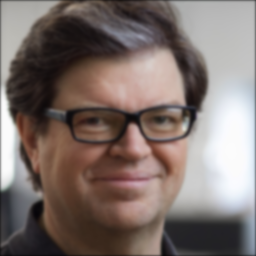
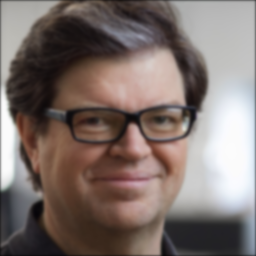
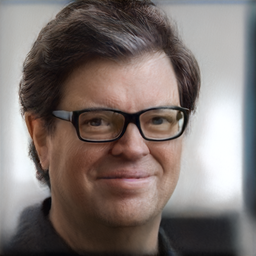
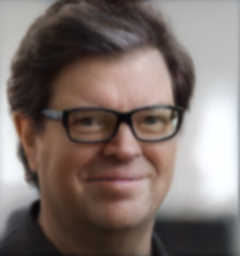

step  681/700: percep_loss 0.08 latent_dist_reg 0.33 loss 0.11 
torch.Size([1, 3, 1084, 1024])
step  682/700: percep_loss 0.08 latent_dist_reg 0.33 loss 0.11 
torch.Size([1, 3, 1084, 1024])
step  683/700: percep_loss 0.08 latent_dist_reg 0.33 loss 0.11 
torch.Size([1, 3, 1084, 1024])
step  684/700: percep_loss 0.08 latent_dist_reg 0.33 loss 0.11 
torch.Size([1, 3, 1084, 1024])
step  685/700: percep_loss 0.08 latent_dist_reg 0.33 loss 0.11 
torch.Size([1, 3, 1084, 1024])
step  686/700: percep_loss 0.08 latent_dist_reg 0.33 loss 0.11 
torch.Size([1, 3, 1084, 1024])
step  687/700: percep_loss 0.08 latent_dist_reg 0.33 loss 0.11 
torch.Size([1, 3, 1084, 1024])
step  688/700: percep_loss 0.08 latent_dist_reg 0.33 loss 0.11 
torch.Size([1, 3, 1084, 1024])
step  689/700: percep_loss 0.08 latent_dist_reg 0.33 loss 0.11 
torch.Size([1, 3, 1084, 1024])
step  690/700: percep_loss 0.08 latent_dist_reg 0.33 loss 0.11 
torch.Size([1, 3, 1084, 1024])
step  691/700: percep_loss 0.08 latent_dist_reg 0.

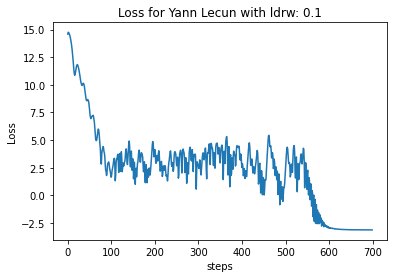

In [ ]:
## Yann Lecun's Deblurring
tar = "/content/gdrive/MyDrive/input_img/inputs/yann_lecun_blur.png"
outdir = "/content/gdrive/MyDrive/input_img/yann/with 700 and  0.1"

yann_loss = invert_image(GAUSSIAN_BLUR_DEGRADATION, tar,outdir,'Yann Lecun' ,num_steps=700,latent_dist_reg_weight=0.1, is_input_degraded=True)

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

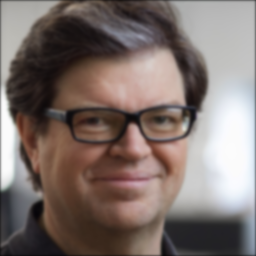
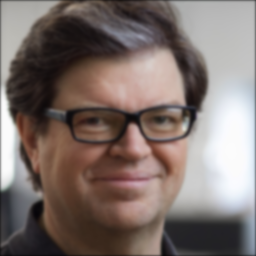
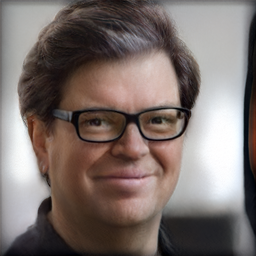
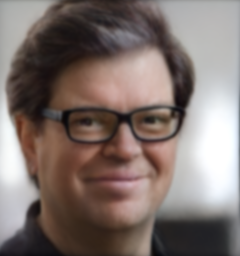

step  981/1000: percep_loss 0.09 latent_dist_reg 1.07 loss 0.09 
torch.Size([1, 3, 1084, 1024])
step  982/1000: percep_loss 0.09 latent_dist_reg 1.07 loss 0.09 
torch.Size([1, 3, 1084, 1024])
step  983/1000: percep_loss 0.09 latent_dist_reg 1.07 loss 0.09 
torch.Size([1, 3, 1084, 1024])
step  984/1000: percep_loss 0.09 latent_dist_reg 1.07 loss 0.09 
torch.Size([1, 3, 1084, 1024])
step  985/1000: percep_loss 0.09 latent_dist_reg 1.07 loss 0.09 
torch.Size([1, 3, 1084, 1024])
step  986/1000: percep_loss 0.09 latent_dist_reg 1.07 loss 0.09 
torch.Size([1, 3, 1084, 1024])
step  987/1000: percep_loss 0.09 latent_dist_reg 1.07 loss 0.09 
torch.Size([1, 3, 1084, 1024])
step  988/1000: percep_loss 0.09 latent_dist_reg 1.07 loss 0.09 
torch.Size([1, 3, 1084, 1024])
step  989/1000: percep_loss 0.09 latent_dist_reg 1.07 loss 0.09 
torch.Size([1, 3, 1084, 1024])
step  990/1000: percep_loss 0.09 latent_dist_reg 1.07 loss 0.09 
torch.Size([1, 3, 1084, 1024])
step  991/1000: percep_loss 0.09 latent_

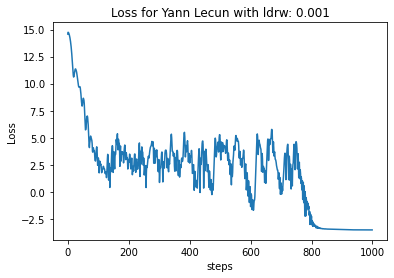

In [ ]:
## Yann Lecun's Deblurring
tar = "/content/gdrive/MyDrive/input_img/inputs/yann_lecun_blur.png"
outdir = "/content/gdrive/MyDrive/input_img/yann/with 1000 and  0.001"

yann_loss = invert_image(GAUSSIAN_BLUR_DEGRADATION, tar,outdir,'Yann Lecun' ,num_steps=1000,latent_dist_reg_weight=0.001, is_input_degraded=True)

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

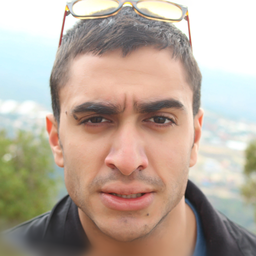
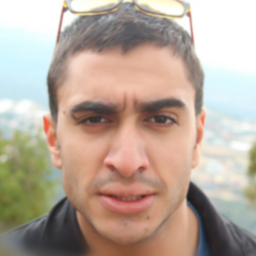
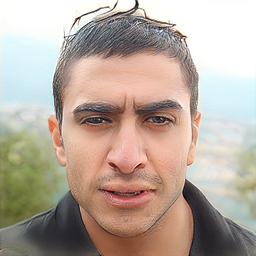
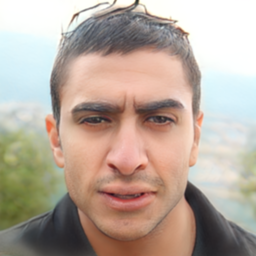

step  981/1000: percep_loss 0.13 latent_dist_reg 0.20 loss 0.17 
torch.Size([1, 3, 1024, 1024])
step  982/1000: percep_loss 0.13 latent_dist_reg 0.20 loss 0.17 
torch.Size([1, 3, 1024, 1024])
step  983/1000: percep_loss 0.13 latent_dist_reg 0.20 loss 0.17 
torch.Size([1, 3, 1024, 1024])
step  984/1000: percep_loss 0.13 latent_dist_reg 0.20 loss 0.17 
torch.Size([1, 3, 1024, 1024])
step  985/1000: percep_loss 0.13 latent_dist_reg 0.20 loss 0.17 
torch.Size([1, 3, 1024, 1024])
step  986/1000: percep_loss 0.13 latent_dist_reg 0.20 loss 0.17 
torch.Size([1, 3, 1024, 1024])
step  987/1000: percep_loss 0.13 latent_dist_reg 0.20 loss 0.17 
torch.Size([1, 3, 1024, 1024])
step  988/1000: percep_loss 0.13 latent_dist_reg 0.20 loss 0.17 
torch.Size([1, 3, 1024, 1024])
step  989/1000: percep_loss 0.13 latent_dist_reg 0.20 loss 0.17 
torch.Size([1, 3, 1024, 1024])
step  990/1000: percep_loss 0.13 latent_dist_reg 0.20 loss 0.17 
torch.Size([1, 3, 1024, 1024])
step  991/1000: percep_loss 0.13 latent_

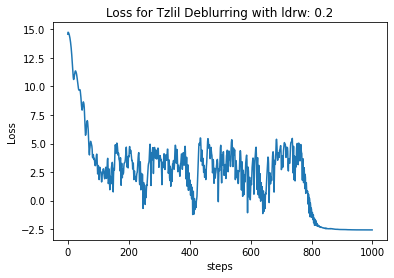

In [ ]:
## Tzlil's reconstruction:
tar = "/content/gdrive/MyDrive/input_img/Tzlil/africa_tzlil_aligned.png"
outdir = "/content/gdrive/MyDrive/input_img/Tzlil/deblur"

tzlil_loss = invert_image(GAUSSIAN_BLUR_DEGRADATION ,tar,outdir, "Tzlil Deblurring", num_steps=1000,latent_dist_reg_weight=0.2)
# Using ldrw = 0.1 got creepy results

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

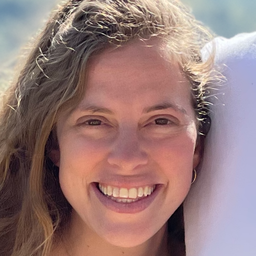
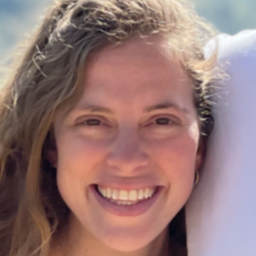
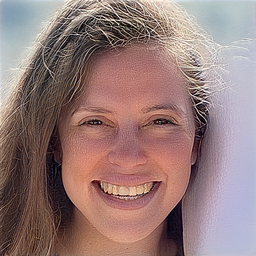
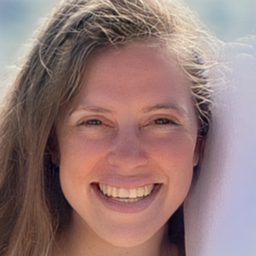

step  681/700: percep_loss 0.16 latent_dist_reg 0.22 loss 0.21 
torch.Size([1, 3, 1024, 1024])
step  682/700: percep_loss 0.16 latent_dist_reg 0.22 loss 0.21 
torch.Size([1, 3, 1024, 1024])
step  683/700: percep_loss 0.16 latent_dist_reg 0.22 loss 0.21 
torch.Size([1, 3, 1024, 1024])
step  684/700: percep_loss 0.16 latent_dist_reg 0.22 loss 0.21 
torch.Size([1, 3, 1024, 1024])
step  685/700: percep_loss 0.16 latent_dist_reg 0.22 loss 0.21 
torch.Size([1, 3, 1024, 1024])
step  686/700: percep_loss 0.16 latent_dist_reg 0.22 loss 0.21 
torch.Size([1, 3, 1024, 1024])
step  687/700: percep_loss 0.16 latent_dist_reg 0.22 loss 0.21 
torch.Size([1, 3, 1024, 1024])
step  688/700: percep_loss 0.16 latent_dist_reg 0.22 loss 0.21 
torch.Size([1, 3, 1024, 1024])
step  689/700: percep_loss 0.16 latent_dist_reg 0.22 loss 0.21 
torch.Size([1, 3, 1024, 1024])
step  690/700: percep_loss 0.16 latent_dist_reg 0.22 loss 0.21 
torch.Size([1, 3, 1024, 1024])
step  691/700: percep_loss 0.16 latent_dist_reg 0.

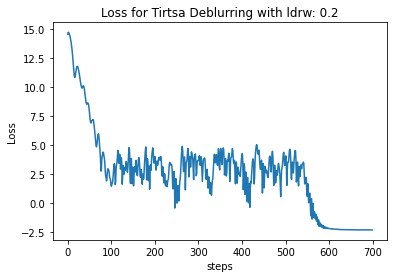

In [ ]:
## Tirtza's reconstruction:
tar = "/content/gdrive/MyDrive/input_img/Tirtsa/tir_aligned.png"
outdir = "/content/gdrive/MyDrive/input_img/Tirtsa/deblur"

tirtz_loss = invert_image(GAUSSIAN_BLUR_DEGRADATION, tar,outdir, "Tirtsa Deblurring", num_steps=700,latent_dist_reg_weight=0.2)

**Inpainting**

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

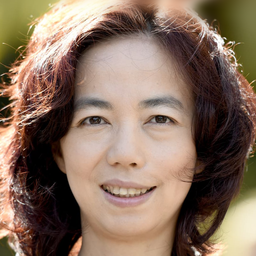
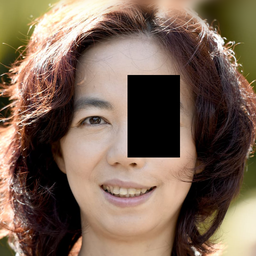
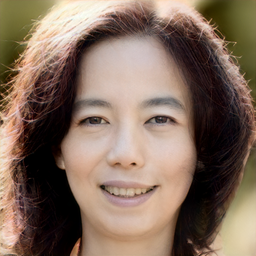
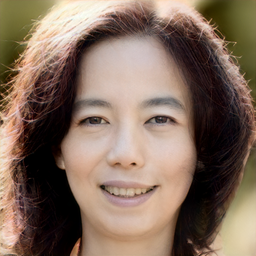

step  781/800: percep_loss 0.17 latent_dist_reg 1.05 loss 0.18 
step  782/800: percep_loss 0.17 latent_dist_reg 1.05 loss 0.18 
step  783/800: percep_loss 0.17 latent_dist_reg 1.05 loss 0.18 
step  784/800: percep_loss 0.17 latent_dist_reg 1.05 loss 0.18 
step  785/800: percep_loss 0.17 latent_dist_reg 1.05 loss 0.18 
step  786/800: percep_loss 0.17 latent_dist_reg 1.05 loss 0.18 
step  787/800: percep_loss 0.17 latent_dist_reg 1.05 loss 0.18 
step  788/800: percep_loss 0.17 latent_dist_reg 1.05 loss 0.18 
step  789/800: percep_loss 0.17 latent_dist_reg 1.05 loss 0.18 
step  790/800: percep_loss 0.17 latent_dist_reg 1.05 loss 0.18 
step  791/800: percep_loss 0.17 latent_dist_reg 1.05 loss 0.18 
step  792/800: percep_loss 0.17 latent_dist_reg 1.05 loss 0.18 
step  793/800: percep_loss 0.17 latent_dist_reg 1.05 loss 0.18 
step  794/800: percep_loss 0.17 latent_dist_reg 1.05 loss 0.18 
step  795/800: percep_loss 0.17 latent_dist_reg 1.05 loss 0.18 
step  796/800: percep_loss 0.17 latent_d

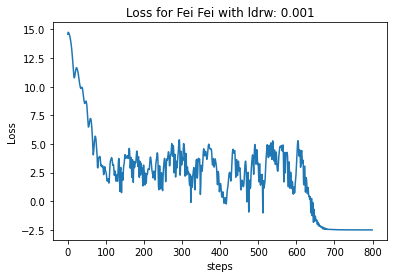

In [ ]:
## Fei Fei's Inpainting
tar = "/content/gdrive/MyDrive/input_img/inputs/fei_fei_li_original.png"
outdir = "/content/gdrive/MyDrive/input_img/fei"

fei_loss = invert_image(INPAINTING_DEGRADATION,tar,outdir,"Fei Fei",num_steps=800)

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

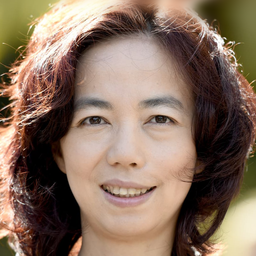
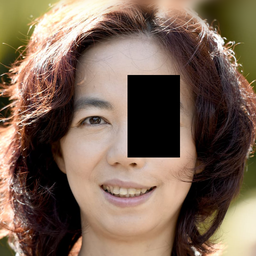
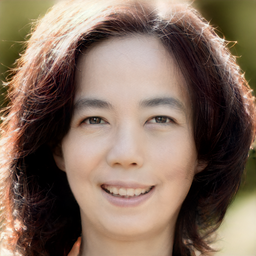
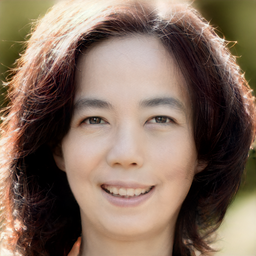

step  781/800: percep_loss 0.16 latent_dist_reg 0.32 loss 0.19 
step  782/800: percep_loss 0.16 latent_dist_reg 0.32 loss 0.19 
step  783/800: percep_loss 0.16 latent_dist_reg 0.32 loss 0.19 
step  784/800: percep_loss 0.16 latent_dist_reg 0.32 loss 0.19 
step  785/800: percep_loss 0.16 latent_dist_reg 0.32 loss 0.19 
step  786/800: percep_loss 0.16 latent_dist_reg 0.32 loss 0.19 
step  787/800: percep_loss 0.16 latent_dist_reg 0.32 loss 0.19 
step  788/800: percep_loss 0.16 latent_dist_reg 0.32 loss 0.19 
step  789/800: percep_loss 0.16 latent_dist_reg 0.32 loss 0.19 
step  790/800: percep_loss 0.16 latent_dist_reg 0.32 loss 0.19 
step  791/800: percep_loss 0.16 latent_dist_reg 0.32 loss 0.19 
step  792/800: percep_loss 0.16 latent_dist_reg 0.32 loss 0.19 
step  793/800: percep_loss 0.16 latent_dist_reg 0.32 loss 0.19 
step  794/800: percep_loss 0.16 latent_dist_reg 0.32 loss 0.19 
step  795/800: percep_loss 0.16 latent_dist_reg 0.32 loss 0.19 
step  796/800: percep_loss 0.16 latent_d

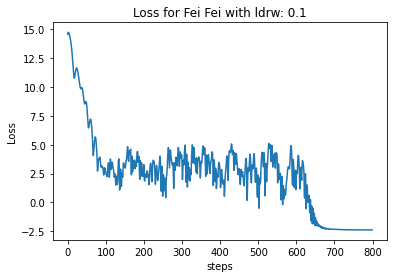

In [ ]:
## Fei Fei's Inpainting
tar = "/content/gdrive/MyDrive/input_img/inputs/fei_fei_li_original.png"
outdir = "/content/gdrive/MyDrive/input_img/fei/with 1200 and 0.3"

fei_loss = invert_image(INPAINTING_DEGRADATION,tar,outdir,"Fei Fei",num_steps=800, latent_dist_reg_weight=0.1)

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

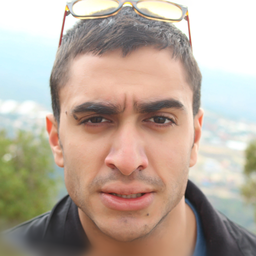
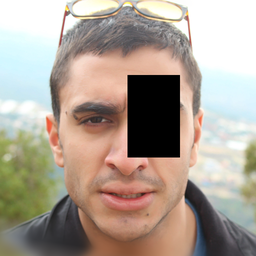
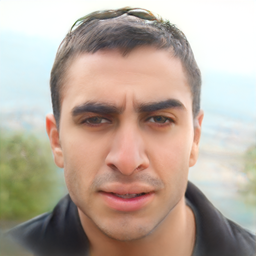
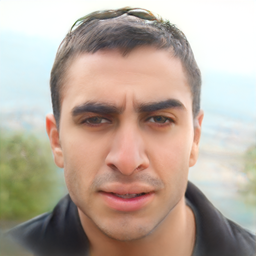

step  781/800: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  782/800: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  783/800: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  784/800: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  785/800: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  786/800: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  787/800: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  788/800: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  789/800: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  790/800: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  791/800: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  792/800: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  793/800: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  794/800: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  795/800: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  796/800: percep_loss 0.13 latent_d

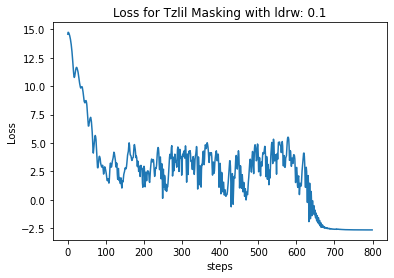

In [ ]:
## Tzlil's reconstruction:
tar = "/content/gdrive/MyDrive/input_img/Tzlil/africa_tzlil_aligned.png"
outdir = "/content/gdrive/MyDrive/input_img/Tzlil/Inpainting/with 800 and 0.1"

tzlil_loss = invert_image(INPAINTING_DEGRADATION, tar,outdir, "Tzlil Masking",num_steps=800,latent_dist_reg_weight=0.1)

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

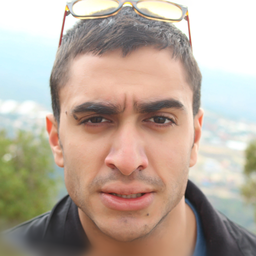
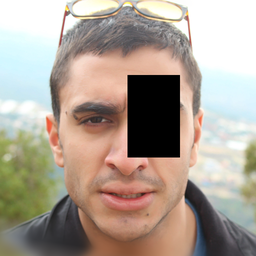
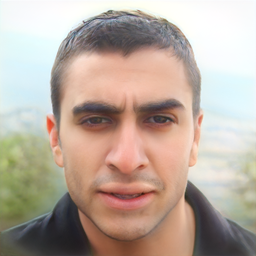
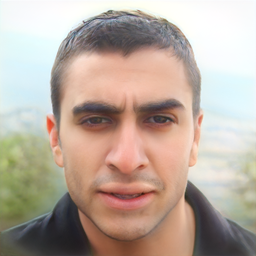

step  781/800: percep_loss 0.15 latent_dist_reg 1.01 loss 0.15 
step  782/800: percep_loss 0.15 latent_dist_reg 1.01 loss 0.15 
step  783/800: percep_loss 0.15 latent_dist_reg 1.01 loss 0.15 
step  784/800: percep_loss 0.15 latent_dist_reg 1.01 loss 0.15 
step  785/800: percep_loss 0.15 latent_dist_reg 1.01 loss 0.15 
step  786/800: percep_loss 0.15 latent_dist_reg 1.01 loss 0.15 
step  787/800: percep_loss 0.15 latent_dist_reg 1.01 loss 0.15 
step  788/800: percep_loss 0.15 latent_dist_reg 1.01 loss 0.15 
step  789/800: percep_loss 0.15 latent_dist_reg 1.01 loss 0.15 
step  790/800: percep_loss 0.15 latent_dist_reg 1.01 loss 0.15 
step  791/800: percep_loss 0.15 latent_dist_reg 1.01 loss 0.15 
step  792/800: percep_loss 0.15 latent_dist_reg 1.01 loss 0.15 
step  793/800: percep_loss 0.15 latent_dist_reg 1.01 loss 0.15 
step  794/800: percep_loss 0.15 latent_dist_reg 1.01 loss 0.15 
step  795/800: percep_loss 0.15 latent_dist_reg 1.01 loss 0.15 
step  796/800: percep_loss 0.15 latent_d

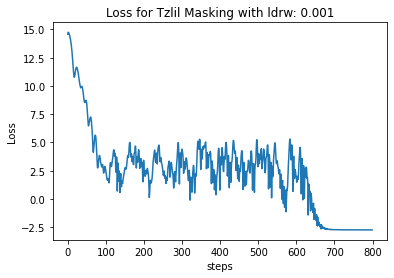

In [ ]:
## Tzlil's reconstruction:
tar = "/content/gdrive/MyDrive/input_img/Tzlil/africa_tzlil_aligned.png"
outdir = "/content/gdrive/MyDrive/input_img/Tzlil/Inpainting/with 800 and 0.001"

tzlil_loss = invert_image(INPAINTING_DEGRADATION, tar,outdir, "Tzlil Masking",num_steps=800)

In [ ]:
## Tirtza's reconstruction:
tar = "/content/gdrive/MyDrive/input_img/Tirtsa/tir_aligned.png"
outdir = "/content/gdrive/MyDrive/input_img/Tirtsa/Inpainting/ with 800 and 0.1"

tirtz_loss = invert_image(INPAINTING_DEGRADATION, tar,outdir, "Tirtsa Inpainting",num_steps=800,latent_dist_reg_weight=0.1)

Loading networks from "https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada/pretrained/ffhq.pkl"...


RuntimeError: ignored

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

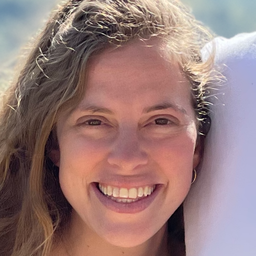
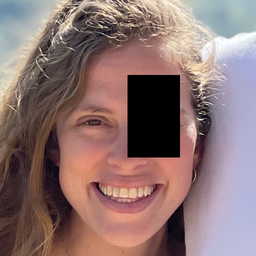
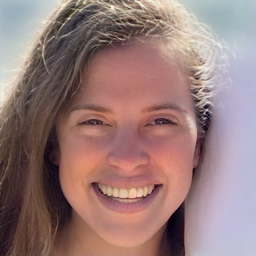
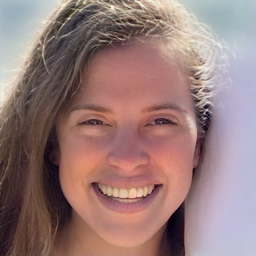

step  781/800: percep_loss 0.16 latent_dist_reg 0.83 loss 0.16 
step  782/800: percep_loss 0.16 latent_dist_reg 0.83 loss 0.16 
step  783/800: percep_loss 0.16 latent_dist_reg 0.83 loss 0.16 
step  784/800: percep_loss 0.16 latent_dist_reg 0.83 loss 0.16 
step  785/800: percep_loss 0.16 latent_dist_reg 0.83 loss 0.16 
step  786/800: percep_loss 0.16 latent_dist_reg 0.83 loss 0.16 
step  787/800: percep_loss 0.16 latent_dist_reg 0.83 loss 0.16 
step  788/800: percep_loss 0.16 latent_dist_reg 0.83 loss 0.16 
step  789/800: percep_loss 0.16 latent_dist_reg 0.83 loss 0.16 
step  790/800: percep_loss 0.16 latent_dist_reg 0.83 loss 0.16 
step  791/800: percep_loss 0.16 latent_dist_reg 0.83 loss 0.16 
step  792/800: percep_loss 0.16 latent_dist_reg 0.83 loss 0.16 
step  793/800: percep_loss 0.16 latent_dist_reg 0.83 loss 0.16 
step  794/800: percep_loss 0.16 latent_dist_reg 0.83 loss 0.16 
step  795/800: percep_loss 0.16 latent_dist_reg 0.83 loss 0.16 
step  796/800: percep_loss 0.16 latent_d

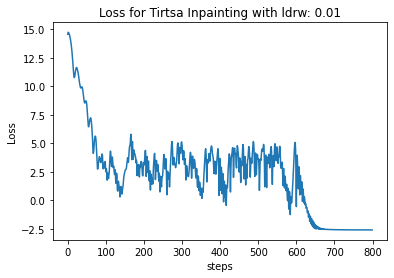

In [ ]:
## Tirtza's reconstruction:
tar = "/content/gdrive/MyDrive/input_img/Tirtsa/tir_aligned.png"
outdir = "/content/gdrive/MyDrive/input_img/Tirtsa/Inpainting/ with 800 and 0.01"
tirtz_loss = invert_image(INPAINTING_DEGRADATION, tar,outdir, "Tirtsa Inpainting",num_steps=800,latent_dist_reg_weight=0.01)

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

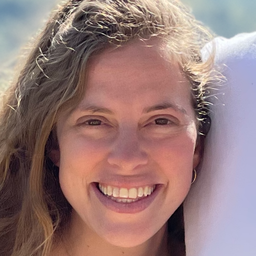
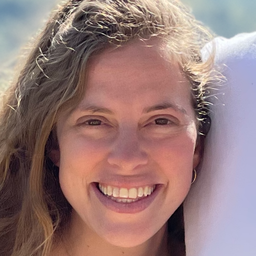
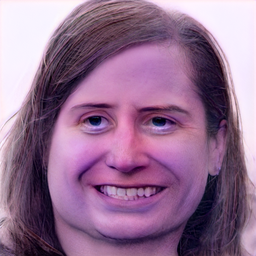
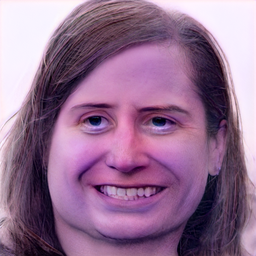

step   61/1000: percep_loss 0.52 latent_dist_reg 0.35 loss 62.48
step   62/1000: percep_loss 0.53 latent_dist_reg 0.36 loss 84.90
step   63/1000: percep_loss 0.52 latent_dist_reg 0.36 loss 116.37
step   64/1000: percep_loss 0.50 latent_dist_reg 0.37 loss 126.47
step   65/1000: percep_loss 0.51 latent_dist_reg 0.37 loss 129.71
step   66/1000: percep_loss 0.54 latent_dist_reg 0.37 loss 119.90
step   67/1000: percep_loss 0.52 latent_dist_reg 0.38 loss 96.05
step   68/1000: percep_loss 0.52 latent_dist_reg 0.38 loss 72.79
step   69/1000: percep_loss 0.50 latent_dist_reg 0.38 loss 47.97
step   70/1000: percep_loss 0.52 latent_dist_reg 0.39 loss 29.32
step   71/1000: percep_loss 0.51 latent_dist_reg 0.39 loss 19.25
step   72/1000: percep_loss 0.51 latent_dist_reg 0.39 loss 16.06
step   73/1000: percep_loss 0.49 latent_dist_reg 0.40 loss 20.79
step   74/1000: percep_loss 0.51 latent_dist_reg 0.40 loss 25.02


In [ ]:
## Tirtza's reconstruction:
tar = "/content/gdrive/MyDrive/input_img/Tirtsa/tir_aligned.png"
outdir = "/content/gdrive/MyDrive/input_img/Tirtsa/reconstruction/ with 1000 and 0.001"
tirtz_loss = invert_image("", tar,outdir, "reconstruction",num_steps=1000,latent_dist_reg_weight=0.001)

In [ ]:
## Tirtza's reconstruction:
tar = "/content/gdrive/MyDrive/input_img/Tirtsa/tir_aligned.png"
outdir = "/content/gdrive/MyDrive/input_img/Tirtsa/Inpainting/ test"
tirtz_loss = invert_image(INPAINTING_DEGRADATION, tar,outdir, "Tirtsa Inpainting",num_steps=1600,latent_dist_reg_weight=0.7)

Loading networks from "https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada/pretrained/ffhq.pkl"...


RuntimeError: ignored

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

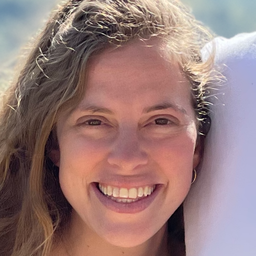
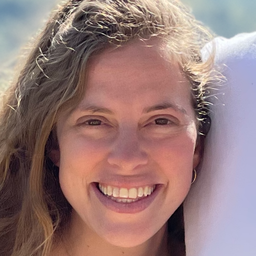
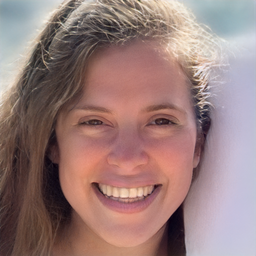
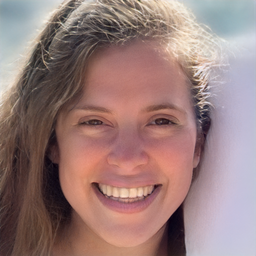

step  981/1000: percep_loss 0.14 latent_dist_reg 0.34 loss 0.17 
step  982/1000: percep_loss 0.14 latent_dist_reg 0.33 loss 0.17 
step  983/1000: percep_loss 0.14 latent_dist_reg 0.33 loss 0.17 
step  984/1000: percep_loss 0.14 latent_dist_reg 0.33 loss 0.17 
step  985/1000: percep_loss 0.14 latent_dist_reg 0.33 loss 0.17 
step  986/1000: percep_loss 0.14 latent_dist_reg 0.33 loss 0.17 
step  987/1000: percep_loss 0.14 latent_dist_reg 0.33 loss 0.17 
step  988/1000: percep_loss 0.14 latent_dist_reg 0.33 loss 0.17 
step  989/1000: percep_loss 0.14 latent_dist_reg 0.33 loss 0.17 
step  990/1000: percep_loss 0.14 latent_dist_reg 0.33 loss 0.17 
step  991/1000: percep_loss 0.14 latent_dist_reg 0.33 loss 0.17 
step  992/1000: percep_loss 0.14 latent_dist_reg 0.33 loss 0.17 
step  993/1000: percep_loss 0.14 latent_dist_reg 0.33 loss 0.17 
step  994/1000: percep_loss 0.14 latent_dist_reg 0.33 loss 0.17 
step  995/1000: percep_loss 0.14 latent_dist_reg 0.33 loss 0.17 
step  996/1000: percep_lo

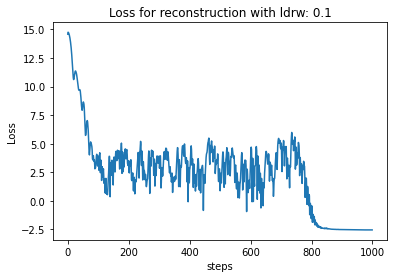

In [ ]:
## Tirtza's reconstruction:
tar = "/content/gdrive/MyDrive/input_img/Tirtsa/tir_aligned.png"
outdir = "/content/gdrive/MyDrive/input_img/Tirtsa/reconstruction/ with 1000 and 0.1"
tirtz_loss = invert_image("", tar,outdir, "reconstruction",num_steps=1000,latent_dist_reg_weight=0.1)

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

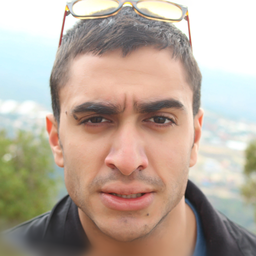
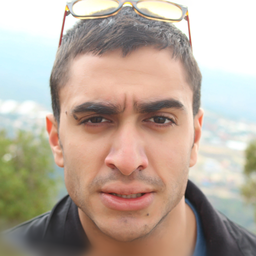
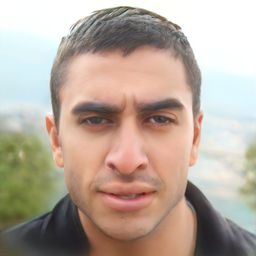
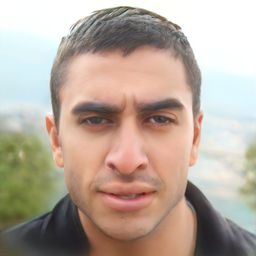

step  981/1000: percep_loss 0.13 latent_dist_reg 0.30 loss 0.16 
step  982/1000: percep_loss 0.13 latent_dist_reg 0.30 loss 0.16 
step  983/1000: percep_loss 0.13 latent_dist_reg 0.30 loss 0.16 
step  984/1000: percep_loss 0.13 latent_dist_reg 0.30 loss 0.16 
step  985/1000: percep_loss 0.13 latent_dist_reg 0.30 loss 0.16 
step  986/1000: percep_loss 0.13 latent_dist_reg 0.30 loss 0.16 
step  987/1000: percep_loss 0.13 latent_dist_reg 0.30 loss 0.16 
step  988/1000: percep_loss 0.13 latent_dist_reg 0.30 loss 0.16 
step  989/1000: percep_loss 0.13 latent_dist_reg 0.30 loss 0.16 
step  990/1000: percep_loss 0.13 latent_dist_reg 0.30 loss 0.16 
step  991/1000: percep_loss 0.13 latent_dist_reg 0.30 loss 0.16 
step  992/1000: percep_loss 0.13 latent_dist_reg 0.30 loss 0.16 
step  993/1000: percep_loss 0.13 latent_dist_reg 0.30 loss 0.16 
step  994/1000: percep_loss 0.13 latent_dist_reg 0.30 loss 0.16 
step  995/1000: percep_loss 0.13 latent_dist_reg 0.30 loss 0.16 
step  996/1000: percep_lo

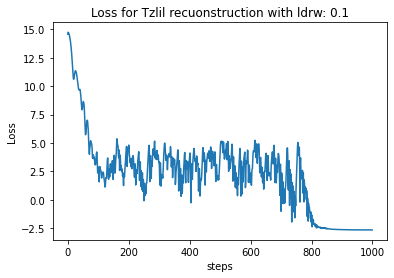

In [ ]:
## Tzlil's reconstruction:
tar = "/content/gdrive/MyDrive/input_img/Tzlil/africa_tzlil_aligned.png"
outdir = "/content/gdrive/MyDrive/input_img/Tzlil/reconstuction/with 1000 and 0.001"

tzlil_loss = invert_image("", tar,outdir, "Tzlil recuonstruction",num_steps=1000,latent_dist_reg_weight=0.1)

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

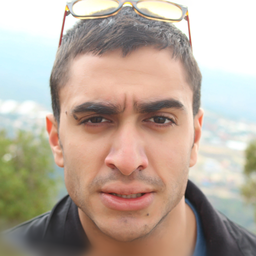
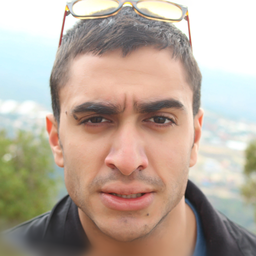
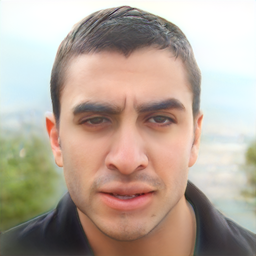
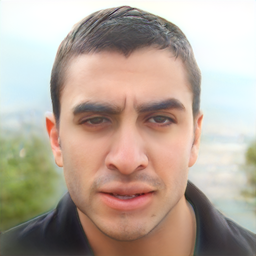

step  981/1000: percep_loss 0.15 latent_dist_reg 1.13 loss 0.15 
step  982/1000: percep_loss 0.15 latent_dist_reg 1.13 loss 0.15 
step  983/1000: percep_loss 0.15 latent_dist_reg 1.13 loss 0.15 
step  984/1000: percep_loss 0.15 latent_dist_reg 1.13 loss 0.15 
step  985/1000: percep_loss 0.15 latent_dist_reg 1.13 loss 0.15 
step  986/1000: percep_loss 0.15 latent_dist_reg 1.13 loss 0.15 
step  987/1000: percep_loss 0.15 latent_dist_reg 1.13 loss 0.15 
step  988/1000: percep_loss 0.15 latent_dist_reg 1.13 loss 0.15 
step  989/1000: percep_loss 0.15 latent_dist_reg 1.13 loss 0.15 
step  990/1000: percep_loss 0.15 latent_dist_reg 1.13 loss 0.15 
step  991/1000: percep_loss 0.15 latent_dist_reg 1.13 loss 0.15 
step  992/1000: percep_loss 0.15 latent_dist_reg 1.13 loss 0.15 
step  993/1000: percep_loss 0.15 latent_dist_reg 1.13 loss 0.15 
step  994/1000: percep_loss 0.15 latent_dist_reg 1.13 loss 0.15 
step  995/1000: percep_loss 0.15 latent_dist_reg 1.13 loss 0.15 
step  996/1000: percep_lo

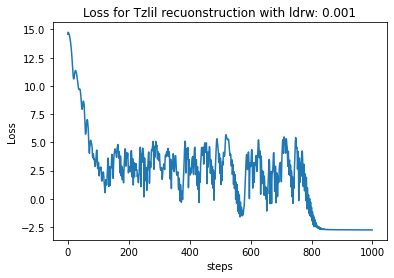

In [179]:
## Tzlil's reconstruction:
tar = "/content/gdrive/MyDrive/input_img/Tzlil/africa_tzlil_aligned.png"
outdir = "/content/gdrive/MyDrive/input_img/Tzlil/reconstuction/with 1000 and 0.001"

tzlil_loss = invert_image("", tar,outdir, "Tzlil recuonstruction",num_steps=1000)